Successfully loaded classifications data.
Number of images in the training set: 61578
Dimensions of the images (Height, Width, Channels): (424, 424, 3)


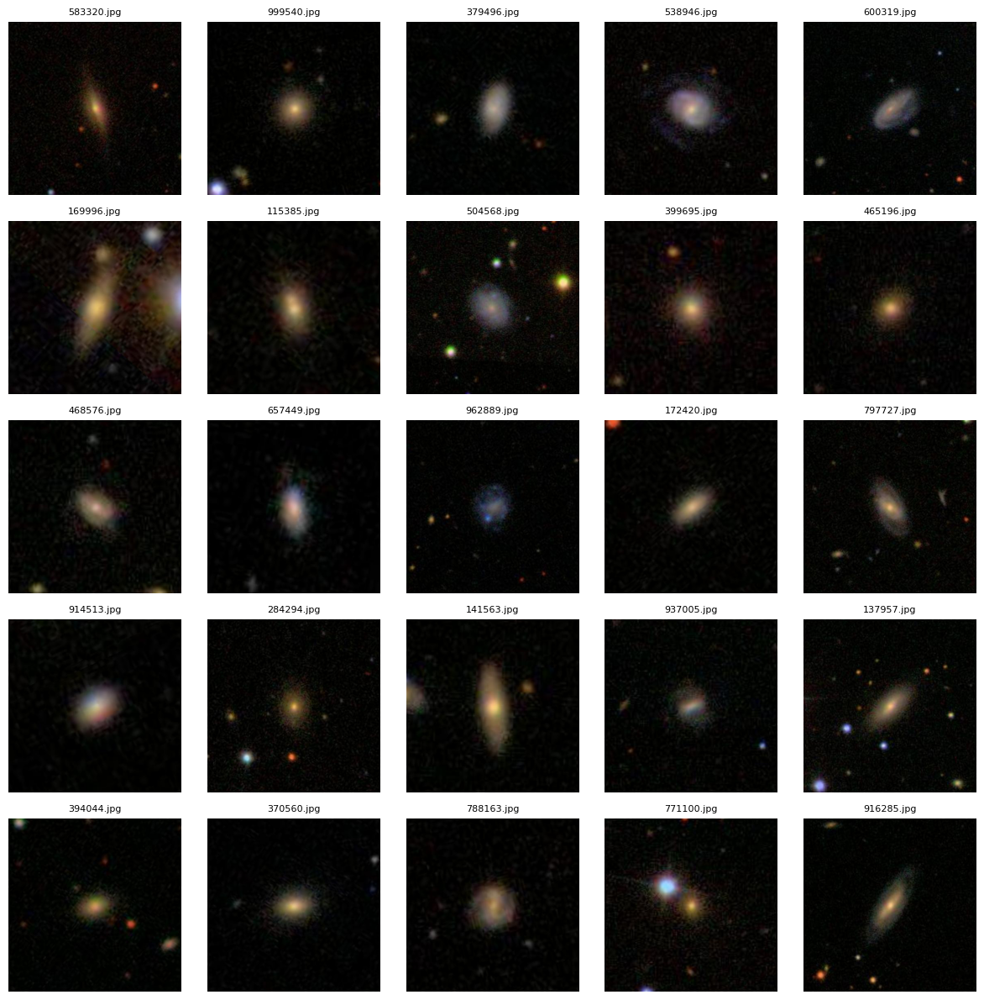

In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import random

image_dir = "training_images" #define path
csv_path = "training_classifications.csv"
# load the classifications data
try:
    df = pd.read_csv(csv_path)
    print("Successfully loaded classifications data.")
except FileNotFoundError:
    print(f"Error: Could not find {csv_path}. Please double-check the file path and ensure it's in your working directory.")

# Get the list of all image files in the directory
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]

# prints # of images in training set
num_images = len(image_files)
print(f"Number of images in the training set: {num_images}")

# print data set dimensions
if num_images > 0:
    sample_image_path = os.path.join(image_dir, image_files[0])
    sample_image = plt.imread(sample_image_path)
    print(f"Dimensions of the images (Height, Width, Channels): {sample_image.shape}")

# plot 25 random images from training set
if num_images >= 25:
    random_images = random.sample(image_files, 25)

    fig, axes = plt.subplots(5, 5, figsize=(12, 12))
    axes = axes.flatten() # Flatten the 5x5 grid for easy iteration

    for i, img_name in enumerate(random_images):
        img_path = os.path.join(image_dir, img_name)

        # Read the image as RGB
        img = plt.imread(img_path)

        # Display the image
        axes[i].imshow(img)
        axes[i].axis('off') # Hide axes for a cleaner look
        axes[i].set_title(img_name, fontsize=8)

    plt.tight_layout()
    plt.savefig('example_galaxies.png')
    plt.show()
else:
    print("Not enough images to plot 25.")



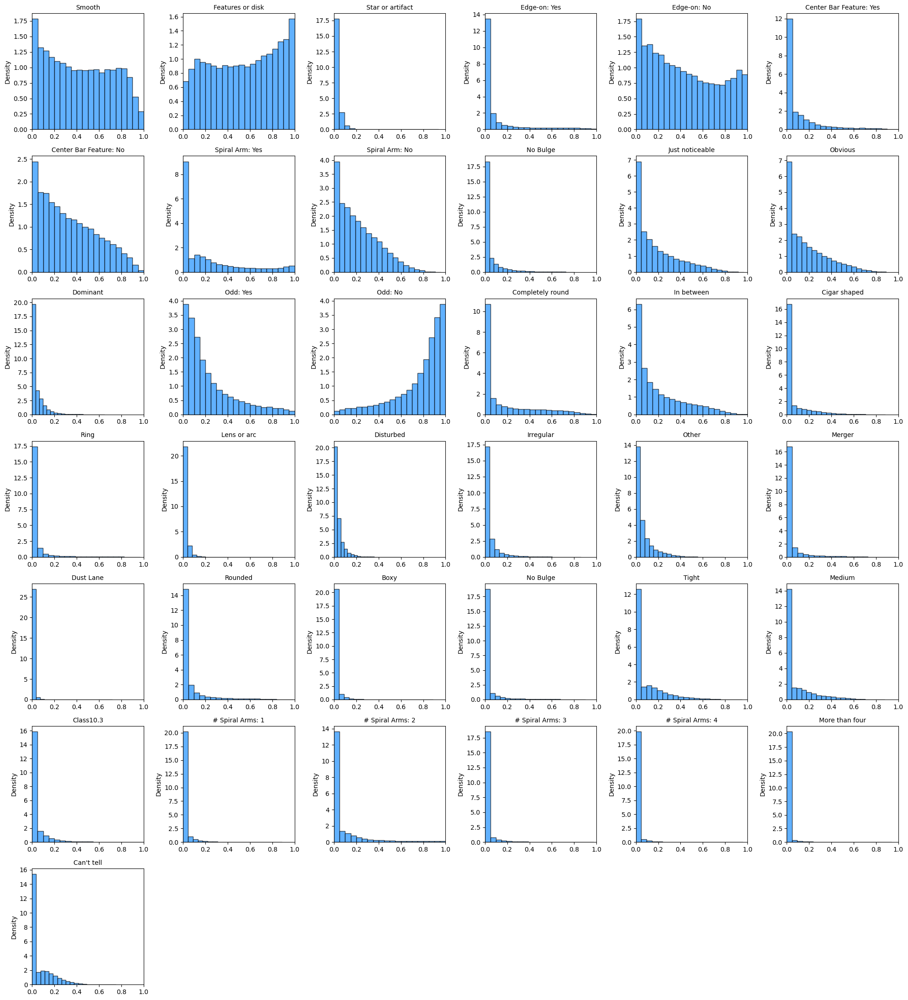

In [2]:
# map column names to descriptive names from Willett et al. 2013, Table 2.
label_mapping = {
    'Class1.1': 'Smooth',
    'Class1.2': 'Features or disk',
    'Class1.3': 'Star or artifact',
    'Class2.1': 'Edge-on: Yes',
    'Class2.2': 'Edge-on: No',
    'Class3.1': 'Center Bar Feature: Yes',
    'Class3.2': 'Center Bar Feature: No',
    'Class4.1': 'Spiral Arm: Yes',
    'Class4.2': 'Spiral Arm: No',
    'Class5.1': 'No Bulge',
    'Class5.2': 'Just noticeable',
    'Class5.3': 'Obvious',
    'Class5.4': 'Dominant',
    'Class6.1': 'Odd: Yes',
    'Class6.2': 'Odd: No',
    'Class7.1': 'Completely round',
    'Class7.2': 'In between',
    'Class7.3': 'Cigar shaped',
    'Class8.1': 'Ring',
    'Class8.2': 'Lens or arc',
    'Class8.3': 'Disturbed',
    'Class8.4': 'Irregular',
    'Class8.5': 'Other',
    'Class8.6': 'Merger',
    'Class8.7': 'Dust Lane',
    'Class9.1': 'Rounded',
    'Class9.2': 'Boxy',
    'Class9.3': 'No Bulge',
    'Class10.1': 'Tight',
    'Class10.2': 'Medium',
    'Class 10.3': 'Loose',
    'Class11.1': '# Spiral Arms: 1',
    'Class11.2': '# Spiral Arms: 2',
    'Class11.3': '# Spiral Arms: 3',
    'Class11.4': '# Spiral Arms: 4',
    'Class11.5': 'More than four',
    'Class11.6': 'Can\'t tell',
}

# Get the label columns.
# Select the next 37 columns.
# Check df.head() to confirm the column structure
label_columns = df.columns[1:38]
df.head()

#  Set up a grid of subplots
fig, axes = plt.subplots(7, 6, figsize=(20, 22))
axes = axes.flatten()

# plot each normalized histogram
for i, col in enumerate(label_columns):
    # Get the descriptive name if you added it to the dictionary, otherwise use the raw column name
    title = label_mapping.get(col, col)

    # Plot normalized histogram (density=True makes it normalized)
    axes[i].hist(df[col].dropna(), bins=20, density=True, alpha=0.7, color='dodgerblue', edgecolor='black')
    axes[i].set_title(title, fontsize=10)
    axes[i].set_xlim(0, 1) # GZ2 labels are probabilities ranging from 0 to 1
    axes[i].set_ylabel('Density')

# Hide any empty subplots at the end of the grid
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.savefig('GZ2_Label_Histogram.png')
plt.show()

### Comments on the Histograms

see grey notebook

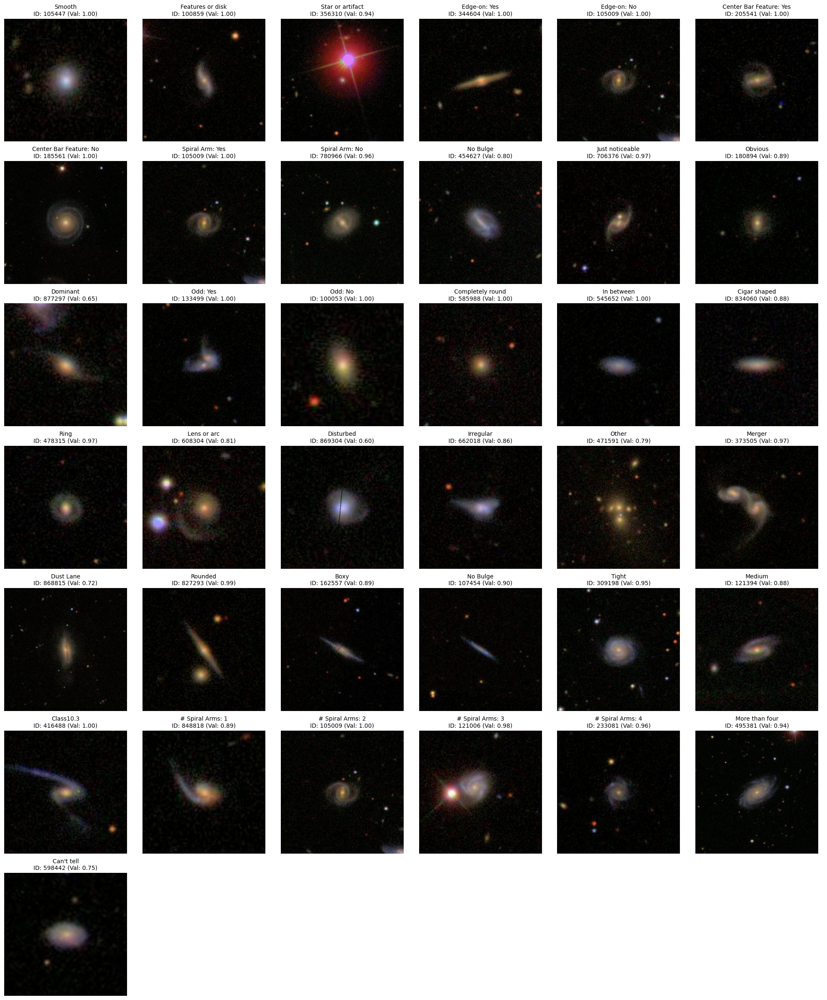

In [3]:
galaxy_id_col = df.columns[0] # Assuming the first column is the Galaxy ID
label_columns = df.columns[1:38] # The 37 label columns

#plot grid
fig, axes = plt.subplots(7, 6, figsize=(20, 24))
axes = axes.flatten()

#  find each labels plot and prototype
for i, col in enumerate(label_columns):
    # Find the index of the maximum value for this specific label
    max_idx = df[col].idxmax()

    # Get the corresponding Galaxy ID and the actual maximum value
    galaxy_id = df.loc[max_idx, galaxy_id_col]
    max_val = df.loc[max_idx, col]

    # Construct the image filename.
    img_filename = f"{galaxy_id}.jpg"
    img_path = os.path.join(image_dir, img_filename)

    # Get the descriptive name for the plot title
    desc_label = label_mapping.get(col, col)

    # Try to load and plot the image
    try:
        img = plt.imread(img_path)
        axes[i].imshow(img)
        # Title includes the descriptive label, the ID, and the max probability score
        axes[i].set_title(f"{desc_label}\nID: {galaxy_id} (Val: {max_val:.2f})", fontsize=10)
    except FileNotFoundError:
        # Fallback if the image isn't found in the directory
        axes[i].text(0.5, 0.5, 'Image Not Found', ha='center', va='center')
        axes[i].set_title(f"{desc_label}\nID: {galaxy_id}", fontsize=10)

    axes[i].axis('off')

# Hide any extra empty subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.savefig('GZ2_label_prototypes.png')
plt.show()

In [4]:
import numpy as np
csv_path = "training_classifications.csv"
df = pd.read_csv(csv_path)

# Identify all label columns that start with 'Class'
label_cols = [c for c in df.columns if c.startswith('Class')]

# Group columns by their primary class number
class_groups = {}
for col in label_cols:
    class_prefix = col.split('.')[0]
    if class_prefix not in class_groups:
        class_groups[class_prefix] = []
    class_groups[class_prefix].append(col)


df_normalized = df.copy()#make a copy of df to store normalized values

#  Normalize each class group so its choices sum to 1
for class_prefix, cols in class_groups.items():
    # Calculate the sum across the columns for this specific class
    row_sums = df[cols].sum(axis=1)

    # Divide each column in the group by the row sum.
    # temporarily replace 0 with NaN to avoid division by zero errors, and then fill any resulting NaNs back with 0.
    df_normalized[cols] = df[cols].div(row_sums.replace(0, np.nan), axis=0).fillna(0)

# Save the new data to a new CSV file
output_filename = "training_classifications_normalized.csv"
df_normalized.to_csv(output_filename, index=False)

print(f"Data successfully saved to {output_filename}")

Data successfully saved to training_classifications_normalized.csv


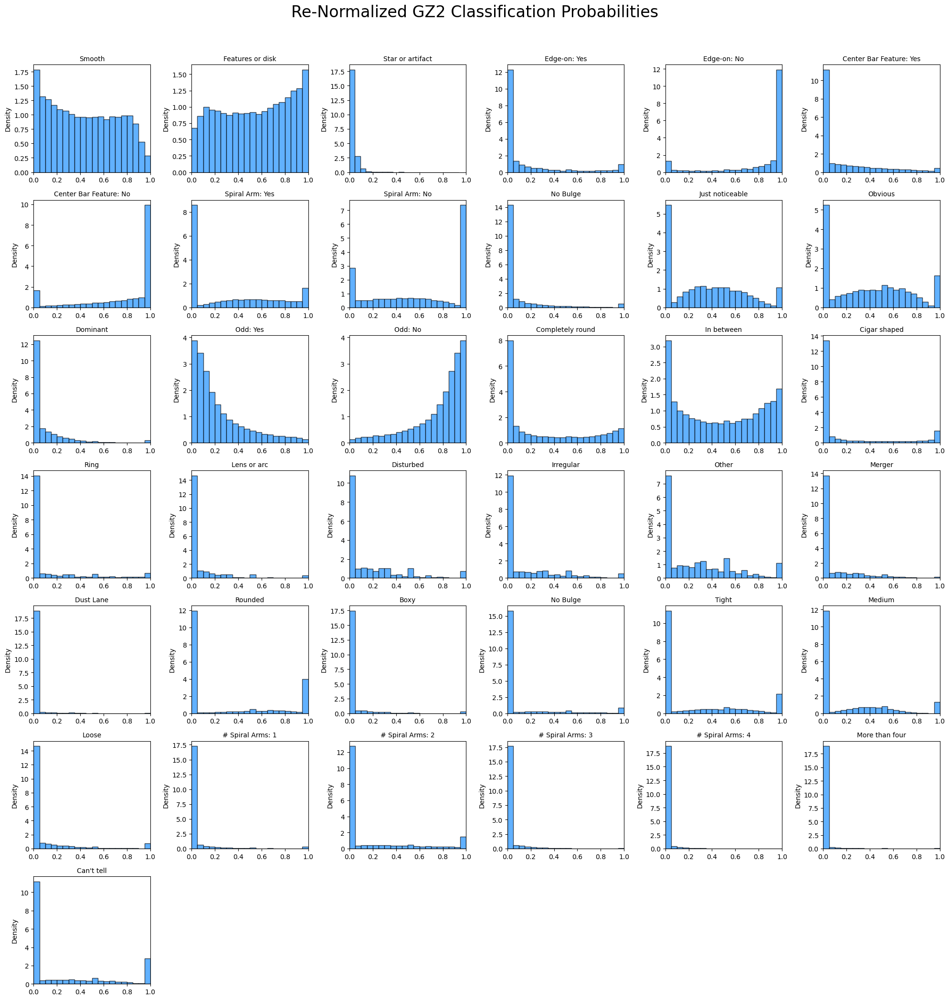

In [5]:
csv_path = "training_classifications_normalized.csv"
df = pd.read_csv(csv_path)

label_mapping = {
    'Class1.1': 'Smooth',
    'Class1.2': 'Features or disk',
    'Class1.3': 'Star or artifact',
    'Class2.1': 'Edge-on: Yes',
    'Class2.2': 'Edge-on: No',
    'Class3.1': 'Center Bar Feature: Yes',
    'Class3.2': 'Center Bar Feature: No',
    'Class4.1': 'Spiral Arm: Yes',
    'Class4.2': 'Spiral Arm: No',
    'Class5.1': 'No Bulge',
    'Class5.2': 'Just noticeable',
    'Class5.3': 'Obvious',
    'Class5.4': 'Dominant',
    'Class6.1': 'Odd: Yes',
    'Class6.2': 'Odd: No',
    'Class7.1': 'Completely round',
    'Class7.2': 'In between',
    'Class7.3': 'Cigar shaped',
    'Class8.1': 'Ring',
    'Class8.2': 'Lens or arc',
    'Class8.3': 'Disturbed',
    'Class8.4': 'Irregular',
    'Class8.5': 'Other',
    'Class8.6': 'Merger',
    'Class8.7': 'Dust Lane',
    'Class9.1': 'Rounded',
    'Class9.2': 'Boxy',
    'Class9.3': 'No Bulge',
    'Class10.1': 'Tight',
    'Class10.2': 'Medium',
    'Class10.3': 'Loose',
    'Class11.1': '# Spiral Arms: 1',
    'Class11.2': '# Spiral Arms: 2',
    'Class11.3': '# Spiral Arms: 3',
    'Class11.4': '# Spiral Arms: 4',
    'Class11.5': 'More than four',
    'Class11.6': "Can't tell",
}

label_columns = [col for col in df.columns if col.startswith('Class')]#get label columns easily cuz they all start w/ class

fig, axes = plt.subplots(7, 6, figsize=(20, 22))
axes = axes.flatten()

for i, col in enumerate(label_columns):
    # Get the descriptive name if you added it to the dictionary, otherwise use the raw column name
    title = label_mapping.get(col, col)

    # Plot normalized histogram (density=True makes it normalized)
    axes[i].hist(df[col].dropna(), bins=20, density=True, alpha=0.7, color='dodgerblue', edgecolor='black')
    axes[i].set_title(title, fontsize=10)
    axes[i].set_xlim(0, 1) # GZ2 labels are probabilities ranging from 0 to 1
    axes[i].set_ylabel('Density')

# Hide any empty subplots at the end of the grid
for j in range(len(label_columns), len(axes)):
    axes[j].axis('off')

fig.suptitle('Re-Normalized GZ2 Classification Probabilities', fontsize=24, y=0.98)

# adjust rect so the tight_layout doesn't overlap the main title
plt.tight_layout(rect=[0, 0.03, 1, 0.96])
plt.savefig('GZ2_Label_Histogram_Renormalized.png')
plt.show()

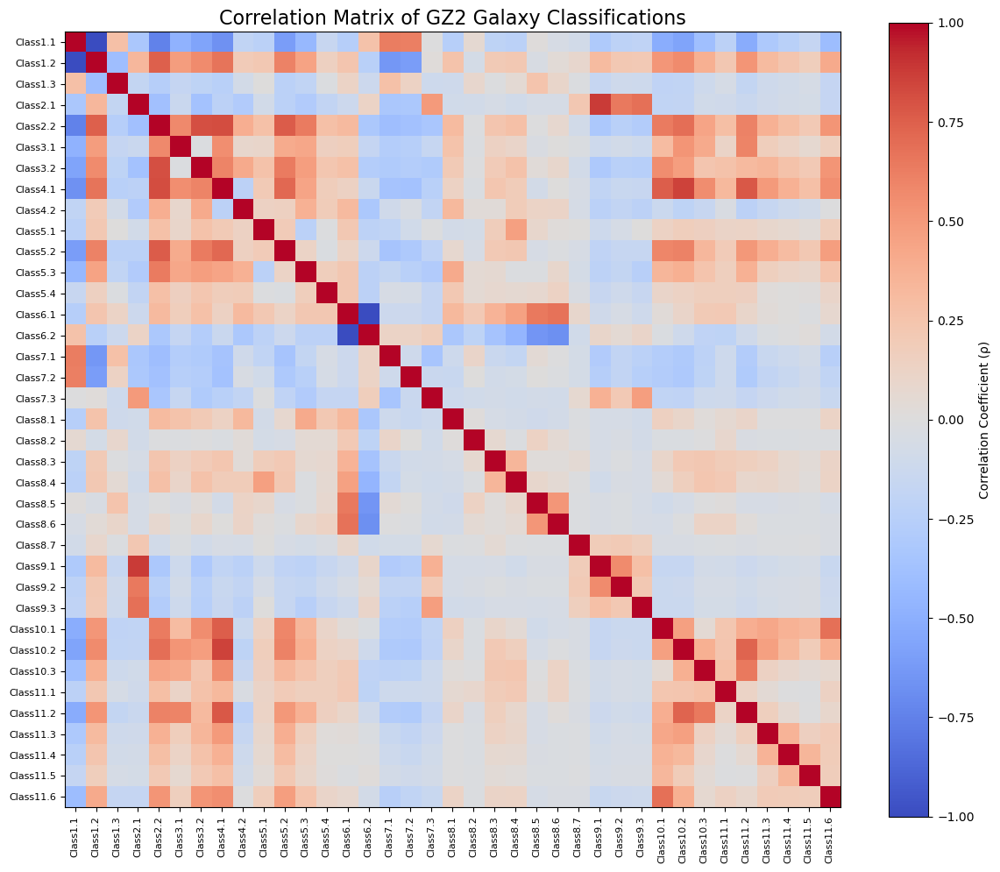

In [6]:
csv_path = "training_classifications.csv"
df = pd.read_csv(csv_path)

# extract labe columns
label_columns = [col for col in df.columns if col.startswith('Class')]
df_labels = df[label_columns]

corr_matrix = df_labels.corr()#compute the correlation matrix

# Plot the correlation matrix as a heatmap
fig, ax = plt.subplots(figsize=(12, 10))
cax = ax.imshow(corr_matrix, cmap='coolwarm', vmin=-1, vmax=1)

fig.colorbar(cax, ax=ax, label='Correlation Coefficient (\u03C1)')# colorbar

#formatting
ax.set_xticks(np.arange(len(label_columns)))
ax.set_yticks(np.arange(len(label_columns)))
ax.set_xticklabels(label_columns, rotation=90, fontsize=8)
ax.set_yticklabels(label_columns, fontsize=8)

ax.set_title("Correlation Matrix of GZ2 Galaxy Classifications", fontsize=16)

plt.tight_layout()
plt.savefig('correlation_matrix.png')

In [7]:


# Mask the lower triangle and the diagonal of correlation matrix to avoid printing duplicates and printing self-correlations
mask = np.triu(np.ones(corr_matrix.shape), k=1).astype(bool)

# Flatten the matrix into a clean list of pairs
correlations = corr_matrix.where(mask).stack().reset_index()
correlations.columns = ['Label_1', 'Label_2', 'Correlation']

# Add a column for the absolute correlation to sort by magnitude
correlations['Abs_Corr'] = correlations['Correlation'].abs()
correlations = correlations.sort_values(by='Abs_Corr', ascending=False)

# Print all pairs, adding visual emphasis to significant ones
print(f"Total unique pairs processed: {len(correlations)}\n")
print("--- Label Correlation Coefficients ---")

for index, row in correlations.iterrows():
    l1 = row['Label_1']
    l2 = row['Label_2']
    corr = row['Correlation']

    # Check absolute value for significance
    if abs(corr) >= 0.7:
        print(f"*** STRONG *** {l1:<10} & {l2:<10} :  {corr:.4f}")
    elif abs(corr) >= 0.4:
        print(f"  * Moderate * {l1:<10} & {l2:<10} :  {corr:.4f}")
    else:
        print(f"                    {l1:<10} & {l2:<10} :  {corr:.4f}")

Total unique pairs processed: 666

--- Label Correlation Coefficients ---
*** STRONG *** Class6.1   & Class6.2   :  -1.0000
*** STRONG *** Class1.1   & Class1.2   :  -0.9924
*** STRONG *** Class2.1   & Class9.1   :  0.8785
*** STRONG *** Class4.1   & Class10.2  :  0.8581
*** STRONG *** Class2.2   & Class4.1   :  0.8139
*** STRONG *** Class2.2   & Class3.2   :  0.8094
*** STRONG *** Class4.1   & Class11.2  :  0.7811
*** STRONG *** Class2.2   & Class5.2   :  0.7589
*** STRONG *** Class4.1   & Class10.1  :  0.7545
*** STRONG *** Class1.2   & Class2.2   :  0.7478
*** STRONG *** Class1.1   & Class2.2   :  -0.7464
*** STRONG *** Class10.2  & Class11.2  :  0.7309
*** STRONG *** Class4.1   & Class5.2   :  0.7134
  * Moderate * Class2.2   & Class10.2  :  0.6883
  * Moderate * Class2.1   & Class9.3   :  0.6823
  * Moderate * Class10.1  & Class11.6  :  0.6813
  * Moderate * Class6.1   & Class8.6   :  0.6719
  * Moderate * Class6.2   & Class8.6   :  -0.6719
  * Moderate * Class1.2   & Class4.1   :

### Comments on Correlation Matrix

For labels that are mutually exclusive you would expect a coefficient of -1.

Some correlations that you would expect are the labels that track from one category to the next. For example, choosing a smooth galaxy takes you to Class 7. As a result there is a strong correlation between 1.1 and the choices in class 7. Alternatively, classes that do not track to each other have a strong inverse relationship. It also makes sense that the spiral galaxy related queries have strong correlations.

Class 4.1 & 10.2 have a strong correlation which raises the concern of classifying how "tight" a galaxies spiral arms are. What does it mean for a galaxy to have a tight, medium or loose spiral. It is an arbitrary classification without a strict definition. There is no identifiable cutoff point. Not to mention, the number of arms that the galaxy has would contribute to crowding, making one more likely to consider a galaxy, tightly wound, when in reality the angle of separation of the arm from the center could be the same as one with two arms classified as loose.

### Image size & Memory

The training images are 424x424 pixels. An RGB pixel takes 3 bytes of storage. If we use RAW images for the training, with a training set of ~60000 images the calculation would be:

$424^2 \times 3 \times 60000 = 3.24\times10^{10}$ bytes.

If the images are stored as float 32, each pixel requires an additional 4 bytes of storage in order to accomodate decimal places values. The calculation becomes:

$424^2 \times 3 \times 4 \times 60000 = 1.30\times10^{11}$ bytes.


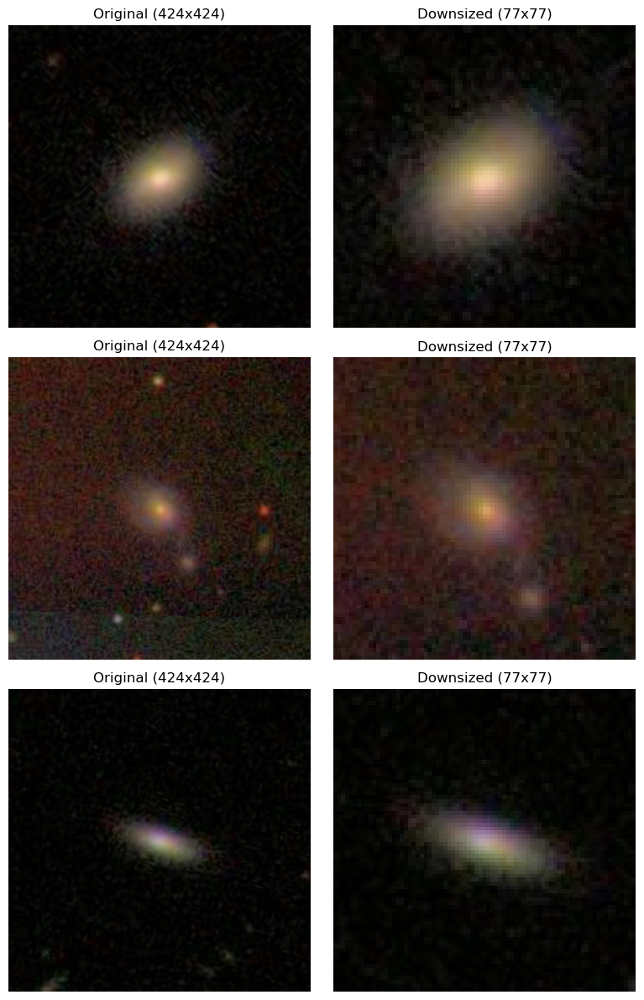

In [8]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def downsize_image(img_path, crop_size=256, target_size=77):
    """
    Crops the center of the image and resizes it.
    Default target_size of 77x77 provides a ~30x reduction in pixels compared to the original 424x424 image.
    """
    # Open the image using PIL
    img = Image.open(img_path)

    # Crop the center (removing mostly empty space at the edges)
    width, height = img.size
    left = (width - crop_size) / 2
    top = (height - crop_size) / 2
    right = (width + crop_size) / 2
    bottom = (height + crop_size) / 2

    img_cropped = img.crop((left, top, right, bottom))

    # Resample to a coarser pixel grid
    img_resized = img_cropped.resize((target_size, target_size), Image.Resampling.LANCZOS)

    # Return both as numpy arrays 
    return np.array(img), np.array(img_resized)

# Setup paths (adjust if your folder is named differently)
image_dir = "training_images"
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]

# plotting comparison for a few random images
num_images_to_plot = 3

if len(image_files) >= num_images_to_plot:
    random_samples = random.sample(image_files, num_images_to_plot)

    fig, axes = plt.subplots(num_images_to_plot, 2, figsize=(8, 4 * num_images_to_plot))

    for i, img_name in enumerate(random_samples):
        img_path = os.path.join(image_dir, img_name)

        # Process the image
        original_img, downsized_img = downsize_image(img_path)

        # Plot Original
        axes[i, 0].imshow(original_img)
        axes[i, 0].set_title(f"Original ({original_img.shape[0]}x{original_img.shape[1]})")
        axes[i, 0].axis('off')

        # Plot Downsized
        axes[i, 1].imshow(downsized_img)
        axes[i, 1].set_title(f"Downsized ({downsized_img.shape[0]}x{downsized_img.shape[1]})")
        axes[i, 1].axis('off')

    plt.savefig('File_Downsize_Comparison.png')
    plt.tight_layout()
    plt.show()
else:
    print("Not enough images found in the directory.")

In [9]:
import os
from PIL import Image
try:
    from tqdm import tqdm # for tracking progress
except ImportError:
    # Fallback if tqdm isn't installed
    def tqdm(iterable, **kwargs): return iterable

# Setup Directories
input_dir = "training_images"
output_dir = "downsized_training_images"
crop_size = 256
target_size = 77

# Create the output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

#Get list of all images
image_files = [f for f in os.listdir(input_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]
print(f"Found {len(image_files)} images. Starting downsizing process...")

# Process and save each image
for img_name in tqdm(image_files, desc="Downsizing images"):
    input_path = os.path.join(input_dir, img_name)
    output_path = os.path.join(output_dir, img_name)

    # Check if the image was already processed in case notebook disconnects and i need to restart
    if os.path.exists(output_path):
        continue

    try:
        # Open original image
        img = Image.open(input_path)

        # Crop the center
        width, height = img.size
        left = (width - crop_size) / 2
        top = (height - crop_size) / 2
        right = (width + crop_size) / 2
        bottom = (height + crop_size) / 2
        img_cropped = img.crop((left, top, right, bottom))

        # Resize to 77x77
        img_resized = img_cropped.resize((target_size, target_size), Image.Resampling.LANCZOS)

        # Save to the new folder
        img_resized.save(output_path)

    except Exception as e:
        print(f"Error processing {img_name}: {e}")

print("Downsizing complete!")

Found 61578 images. Starting downsizing process...


Downsizing images: 100%|███████████████| 61578/61578 [00:01<00:00, 43290.83it/s]

Downsizing complete!


Total objects: 61578
Training set size: 49262 (80%)
Validation set size: 12316 (20%)


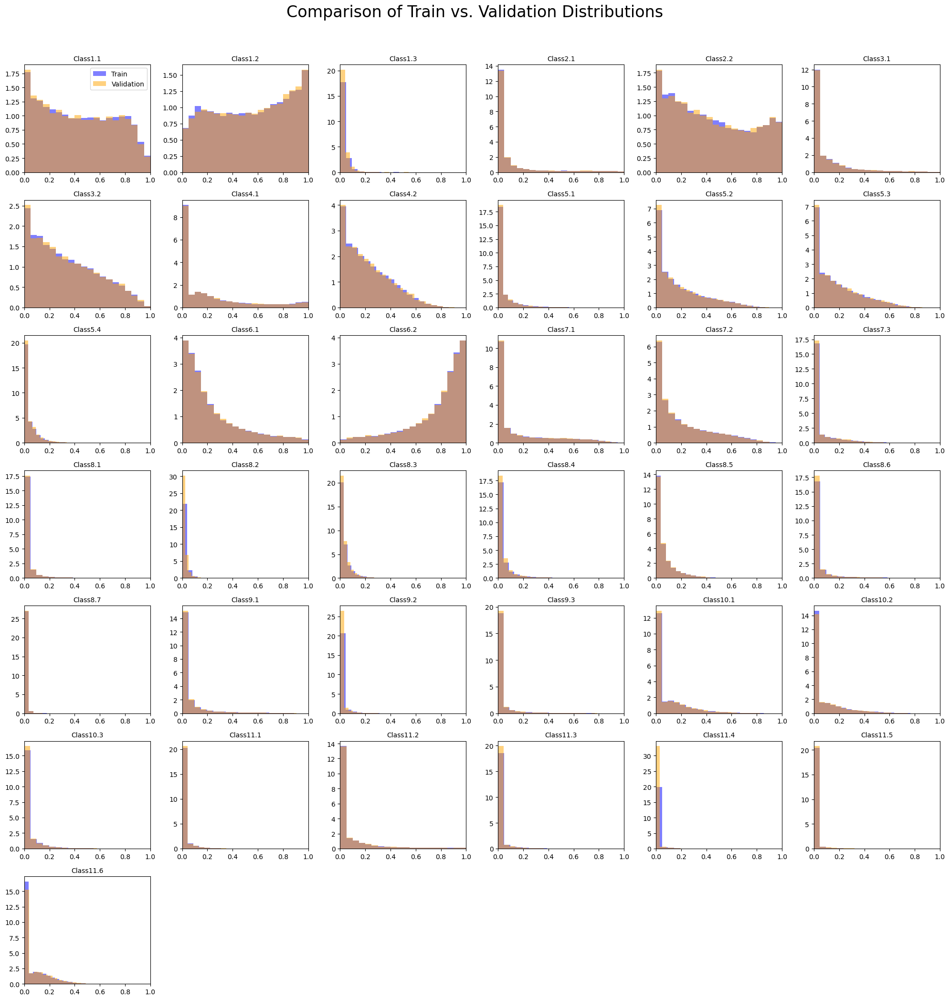

In [10]:
from sklearn.model_selection import train_test_split

#  Split the data
# random_state ensures the "random" split is reproducible every time you run the cell (I used 84 as my initial seed)
train_df, val_df = train_test_split(df, test_size=0.20, random_state=84)

print(f"Total objects: {len(df)}")
print(f"Training set size: {len(train_df)} ({len(train_df)/len(df)*100:.0f}%)")
print(f"Validation set size: {len(val_df)} ({len(val_df)/len(df)*100:.0f}%)")

# Get the label columns (any column starting with 'Class')
label_columns = [col for col in df.columns if col.startswith('Class')]

# Plot distributions to ensure no systematic differences
fig, axes = plt.subplots(7, 6, figsize=(20, 22))
axes = axes.flatten()

for i, col in enumerate(label_columns):
    # Plot training data
    axes[i].hist(train_df[col].dropna(), bins=20, density=True, alpha=0.5, color='blue', label='Train')

    # Plot validation data overlapping the training data
    axes[i].hist(val_df[col].dropna(), bins=20, density=True, alpha=0.5, color='orange', label='Validation')

    axes[i].set_title(col, fontsize=10)
    axes[i].set_xlim(0, 1)

    # add the legend to the very first plot so it doesn't clutter the whole image
    if i == 0:
        axes[i].legend()

# Hide any extra empty subplots
for j in range(len(label_columns), len(axes)):
    axes[j].axis('off')

plt.savefig("Training_vs_CV_set.png")

fig.suptitle('Comparison of Train vs. Validation Distributions', fontsize=24, y=0.98)
plt.tight_layout(rect=[0, 0.03, 1, 0.96])
plt.show()

In [11]:
import os
import numpy as np
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image

# ─── PyTorch Dataset

class GalaxyDataset(Dataset):
    """
    Loads downsized galaxy images on demand from disk.
    Works with PyTorch's DataLoader for automatic batching, shuffling, and parallel workers.
    """
    def __init__(self, dataframe, image_dir, label_columns, transform=None):
        """
        Args:
            dataframe:     DataFrame containing galaxy IDs and labels
            image_dir:     Path to the folder of downsized images
            label_columns: List of the 37 'Class...' column names
            transform:     Optional torchvision transform to apply to each image
        """
        self.df = dataframe.reset_index(drop=True)
        self.image_dir = image_dir
        self.label_cols = label_columns
        self.transform = transform

        # The first column of the CSV is assumed to be the galaxy ID
        self.id_col = self.df.columns[0]

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        galaxy_id = int(row[self.id_col])  # cast float → int to avoid "702634.0.jpg"
        img_path = os.path.join(self.image_dir, f"{galaxy_id}.jpg")

        # Load image -> float32 tensor in [0, 1], shape (3, H, W)
        img = Image.open(img_path).convert("RGB")
        img_tensor = torch.tensor(
            np.array(img), dtype=torch.float32
        ).permute(2, 0, 1) / 255.0   # (H,W,C) → (C,H,W)

        if self.transform:
            img_tensor = self.transform(img_tensor)

        # Labels -> float32 tensor, shape (37,)
        labels = torch.tensor(
            row[self.label_cols].values.astype(np.float32)
        )

        return img_tensor, labels


#  Build datasets & loaders 

DOWNSIZED_DIR = "downsized_training_images"
CSV_PATH      = "training_classifications.csv"
BATCH_SIZE    = 128   # ~100–200 is comfortable on 4 GB DataHub

df            = pd.read_csv(CSV_PATH)
label_columns = [c for c in df.columns if c.startswith("Class")]

# Re-use your existing train/val split
# (train_df and val_df already defined from step 12)
train_dataset = GalaxyDataset(train_df, DOWNSIZED_DIR, label_columns)
val_dataset   = GalaxyDataset(val_df, DOWNSIZED_DIR, label_columns)

train_loader = DataLoader(
    train_dataset,
    batch_size  = BATCH_SIZE,
    shuffle     = True,
    num_workers = 0,     # must be 0 in Jupyter notebooks
    pin_memory  = False, # not supported on MPS 
)

val_loader = DataLoader(
    val_dataset,
    batch_size = BATCH_SIZE,
    shuffle = False,
    num_workers = 0,
    pin_memory = False,
)

print(f"Train batches: {len(train_loader)} | Val batches: {len(val_loader)}")

# speed check
import time

start = time.time()
images, labels = next(iter(train_loader)) # load one batch
elapsed = time.time() - start

print(f"Batch shape : {images.shape}") # expect (128, 3, 77, 77)
print(f"Labels shape: {labels.shape}")      # expect (128, 37)
print(f"Time/image  : {elapsed / BATCH_SIZE * 1000:.2f} ms  "
      f"(target: <10 ms)")

Train batches: 385 | Val batches: 97
Batch shape : torch.Size([128, 3, 77, 77])
Labels shape: torch.Size([128, 37])
Time/image  : 0.90 ms  (target: <10 ms)


In [12]:
import torch
import numpy as np

# Compute the mean label vector from the training set 

label_columns = [c for c in df.columns if c.startswith("Class")]

# Shape: (37,) — one mean per label
train_means = train_df[label_columns].mean(axis=0).values.astype(np.float32)

print("Training label means (first 5):", train_means[:5])


#  RMSE helper 

def rmse(true_labels, pred_labels):
    """
    Root mean squared error over all galaxies and all 37 labels.
    Inputs can be numpy arrays of shape (N, 37).
    """
    return np.sqrt(np.mean((true_labels - pred_labels) ** 2))


#  Build prediction matrices 
# For every galaxy, the prediction is simply the same mean vector.

true_train = train_df[label_columns].values.astype(np.float32)  # (N_train, 37)
true_val = val_df[label_columns].values.astype(np.float32)    # (N_val,   37)

# Broadcast train_means to match the number of rows
pred_train = np.tile(train_means, (len(true_train), 1))  # (N_train, 37)
pred_val = np.tile(train_means, (len(true_val),   1))  # (N_val,   37)


#  Compute and report 

train_loss = rmse(true_train, pred_train)
val_loss = rmse(true_val,   pred_val)

print(f"Baseline RMSE (training set)  : {train_loss:.4f}")
print(f"Baseline RMSE (validation set): {val_loss:.4f}")

Training label means (first 5): [0.43350703 0.5412187  0.0252743  0.10587572 0.43534297]
Baseline RMSE (training set)  : 0.1638
Baseline RMSE (validation set): 0.1639


In [13]:
import torch
import torch.nn as nn
import torchvision.models as models
import matplotlib.pyplot as plt
import time

# Buidling the modified resnet 18

def build_resnet(num_labels=37):
    
    #ResNet-18 modified for galaxy classification:
      #- First conv layer adjusted for 77x77 input (smaller kernel/stride)
     # - Final FC layer outputs 37 values
     # - Sigmoid activation to keep outputs in [0, 1]
    
    model = models.resnet18(weights=None)  # train from scratch

    # The default ResNet first layer uses a 7x7 kernel with stride 2 — too
    # aggressive for our small 77x77 images. Replace it with a smaller one.
    model.conv1 = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1, bias=False)
    model.maxpool = nn.Identity()  # also remove the early maxpool for the same reason

    # Replace the final classification layer to output 37 labels
    model.fc = nn.Sequential(
        nn.Linear(model.fc.in_features, num_labels),
        nn.Sigmoid()  # forces all outputs into [0, 1]
    )

    return model


device = (
    torch.device("mps")   if torch.backends.mps.is_available()  # Apple Silicon
    else torch.device("cuda") if torch.cuda.is_available()       # Nvidia GPU
    else torch.device("cpu")
)

model = build_resnet(num_labels=37).to(device)
print(f"Using device: {device}")
print(f"Trainable parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad):,}")


# Loss function and optimizer 

def rmse_loss(preds, targets):
    return torch.sqrt(torch.mean((preds - targets) ** 2))

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

"""
# Training loop 

def train_one_epoch(model, loader, optimizer, device):
    model.train()
    total_loss = 0.0
    for images, labels in loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        preds = model(images)
        loss = rmse_loss(preds, labels)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    return total_loss / len(loader)


def validate(model, loader, device):
    model.eval()
    total_loss = 0.0
    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            preds = model(images)
            total_loss += rmse_loss(preds, labels).item()

    return total_loss / len(loader)


#  Run training 

NUM_EPOCHS = 15  # increase if validation loss is still dropping at the end

train_losses = []
val_losses = []

for epoch in range(NUM_EPOCHS):
    t0 = time.time()
    train_loss = train_one_epoch(model, train_loader, optimizer, device)
    val_loss = validate(model, val_loader, device)
    elapsed = time.time() - t0

    train_losses.append(train_loss)
    val_losses.append(val_loss)

    print(f"Epoch {epoch+1:02d}/{NUM_EPOCHS} | "
          f"Train RMSE: {train_loss:.4f} | "
          f"Val RMSE: {val_loss:.4f} | "
          f"{elapsed:.1f}s")


#Save the model and training history 

torch.save({
    "model_state": model.state_dict(),
    "optimizer_state": optimizer.state_dict(),
    "train_losses": train_losses,
    "val_losses": val_losses,
    "num_epochs": NUM_EPOCHS,
}, "resnet18_galaxy.pt")

print("Model saved to resnet18_galaxy.pt")


# plot training and validation loss 

fig, ax = plt.subplots(figsize=(9, 5))
epochs  = range(1, NUM_EPOCHS + 1)

ax.plot(epochs, train_losses, label="Training RMSE",   color="steelblue")
ax.plot(epochs, val_losses, label="Validation RMSE", color="tomato")

ax.axhline(0.13, color="gray", linestyle="--", linewidth=0.8, label="Baseline (~0.13)")
ax.set_xlabel("Epoch")
ax.set_ylabel("RMSE Loss")
ax.set_title("ResNet-18 Training History")
ax.legend()
plt.tight_layout()
plt.savefig("resnet18_loss.png", dpi=150)
plt.show()
"""

Using device: mps
Trainable parameters: 11,187,813


'\n# Training loop \n\ndef train_one_epoch(model, loader, optimizer, device):\n    model.train()\n    total_loss = 0.0\n    for images, labels in loader:\n        images, labels = images.to(device), labels.to(device)\n\n        optimizer.zero_grad()\n        preds = model(images)\n        loss = rmse_loss(preds, labels)\n        loss.backward()\n        optimizer.step()\n\n        total_loss += loss.item()\n\n    return total_loss / len(loader)\n\n\ndef validate(model, loader, device):\n    model.eval()\n    total_loss = 0.0\n    with torch.no_grad():\n        for images, labels in loader:\n            images, labels = images.to(device), labels.to(device)\n            preds = model(images)\n            total_loss += rmse_loss(preds, labels).item()\n\n    return total_loss / len(loader)\n\n\n#  Run training \n\nNUM_EPOCHS = 15  # increase if validation loss is still dropping at the end\n\ntrain_losses = []\nval_losses = []\n\nfor epoch in range(NUM_EPOCHS):\n    t0 = time.time()\n    tr

In [14]:
# to load model later

def load_resnet(path, device):
    checkpoint = torch.load(path, map_location=device)
    model = build_resnet(num_labels=37).to(device)
    model.load_state_dict(checkpoint["model_state"])
    return model, checkpoint["train_losses"], checkpoint["val_losses"]

model, train_losses, val_losses = load_resnet("resnet18_galaxy.pt", device)

In [15]:
# ResNet-18 with loss tracked vs. images seen 
# same as last model except i dont have to run the training loop. build_resnet, rmse_loss, device stays the same.
"""
NUM_EPOCHS = 15   # increase if val loss is still falling at the end
LOG_INTERVAL = 10   # log loss every N batches (controls curve smoothness)

train_loss_history = []   # (images_seen, loss) pairs
val_loss_history = []   # (images_seen, loss) pairs
images_seen = 0

best_val_loss = float("inf")

for epoch in range(NUM_EPOCHS):
    model.train()
    running_loss  = 0.0
    batches_since_log = 0
    t0 = time.time()

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        preds = model(images)
        loss  = rmse_loss(preds, labels)
        loss.backward()
        optimizer.step()

        images_seen += images.size(0)
        running_loss += loss.item()
        batches_since_log += 1

        # Log a smoothed training loss every LOG_INTERVAL batches
        if batches_since_log >= LOG_INTERVAL:
            avg = running_loss / batches_since_log
            train_loss_history.append((images_seen, avg))
            running_loss      = 0.0
            batches_since_log = 0

    # Flush any remaining batches at the end of the epoch
    if batches_since_log > 0:
        train_loss_history.append((images_seen, running_loss / batches_since_log))

    # ── validation, calculated per epoch
    model.eval()
    total_val = 0.0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            total_val += rmse_loss(model(images), labels).item()

    val_loss = total_val / len(val_loader)
    val_loss_history.append((images_seen, val_loss))

    # Save the best model automatically
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save({
            "model_state":       model.state_dict(),
            "optimizer_state":   optimizer.state_dict(),
            "epoch":             epoch + 1,
            "best_val_loss":     best_val_loss,
            "train_loss_history": train_loss_history,
            "val_loss_history":  val_loss_history,
        }, "resnet18_best.pt")

    print(f"Epoch {epoch+1:02d}/{NUM_EPOCHS} | "
          f"Val RMSE: {val_loss:.4f} | "
          f"Best: {best_val_loss:.4f} | "
          f"Images seen: {images_seen:,} | "
          f"{time.time()-t0:.1f}s")


#  Plot loss vs. number of training images seen 

train_x, train_y = zip(*train_loss_history)
val_x,   val_y   = zip(*val_loss_history)

fig, ax = plt.subplots(figsize=(10, 5))

ax.plot(train_x, train_y, color="steelblue", linewidth=1.2, label="Training RMSE")
ax.plot(val_x,   val_y,   color="tomato",    linewidth=2.0,
        marker="o", markersize=4, label="Validation RMSE")

ax.axhline(0.13, color="gray", linestyle="--", linewidth=0.8,
           label="Mean-prediction baseline (~0.13)")

# Mark where the best validation loss occurred
best_x = val_x[val_y.index(min(val_y))]
ax.axvline(best_x, color="green", linestyle=":", linewidth=1.0,
           label=f"Best val loss ({min(val_y):.4f})")

ax.set_xlabel("Training images seen")
ax.set_ylabel("RMSE Loss")
ax.set_title("ResNet-18 Training History")
ax.legend()
plt.tight_layout()
plt.savefig("resnet18_step15_loss.png", dpi=150)
plt.show()

print(f"\nFinal best validation RMSE: {best_val_loss:.4f}")
print(f"Model saved to resnet18_best.pt")
"""

'\nNUM_EPOCHS = 15   # increase if val loss is still falling at the end\nLOG_INTERVAL = 10   # log loss every N batches (controls curve smoothness)\n\ntrain_loss_history = []   # (images_seen, loss) pairs\nval_loss_history = []   # (images_seen, loss) pairs\nimages_seen = 0\n\nbest_val_loss = float("inf")\n\nfor epoch in range(NUM_EPOCHS):\n    model.train()\n    running_loss  = 0.0\n    batches_since_log = 0\n    t0 = time.time()\n\n    for images, labels in train_loader:\n        images, labels = images.to(device), labels.to(device)\n\n        optimizer.zero_grad()\n        preds = model(images)\n        loss  = rmse_loss(preds, labels)\n        loss.backward()\n        optimizer.step()\n\n        images_seen += images.size(0)\n        running_loss += loss.item()\n        batches_since_log += 1\n\n        # Log a smoothed training loss every LOG_INTERVAL batches\n        if batches_since_log >= LOG_INTERVAL:\n            avg = running_loss / batches_since_log\n            train_loss_

In [16]:
#  To load the best model 

def load_best_resnet(path, device):
    checkpoint         = torch.load(path, map_location=device)
    model              = build_resnet(num_labels=37).to(device)
    model.load_state_dict(checkpoint["model_state"])
    train_loss_history = checkpoint["train_loss_history"]
    val_loss_history   = checkpoint["val_loss_history"]
    print(f"Loaded model from epoch {checkpoint['epoch']} "
          f"with best val RMSE {checkpoint['best_val_loss']:.4f}")
    return model, train_loss_history, val_loss_history

model, train_loss_history, val_loss_history = load_best_resnet("resnet18_best.pt", device)

Loaded model from epoch 15 with best val RMSE 0.0950


In [18]:
"""#  Recover all history variables from saved checkpoints 
import torch

device = (
    torch.device("mps")  if torch.backends.mps.is_available()
    else torch.device("cuda") if torch.cuda.is_available()
    else torch.device("cpu")
)

#  Load all three checkpoints 
resnet_ckpt = torch.load("resnet18_best.pt", map_location=device)
cnn_ckpt = torch.load("custom_cnn_best.pt", map_location=device)
aug_ckpt = torch.load("resnet18_augmented_best.pt", map_location=device)

#  Restore history variables 

train_loss_history = resnet_ckpt["train_loss_history"]
val_loss_history = resnet_ckpt["val_loss_history"]

cnn_train_history = cnn_ckpt["train_history"]
cnn_val_history = cnn_ckpt["val_history"]

aug_train_history  = aug_ckpt["train_history"]
aug_val_history = aug_ckpt["val_history"]
aug_lr_history = aug_ckpt["lr_history"]

#Restore models 
model = build_resnet(num_labels=37).to(device)
model.load_state_dict(resnet_ckpt["model_state"])

cnn_model = GalaxyCNN(num_labels=37).to(device)
cnn_model.load_state_dict(cnn_ckpt["model_state"])

aug_model = build_resnet(num_labels=37).to(device)
aug_model.load_state_dict(aug_ckpt["model_state"])

# Confirm everything loaded correctly 
print(f"ResNet-18       — best val RMSE: {resnet_ckpt['best_val_loss']:.4f}, "
      f"epoch: {resnet_ckpt['epoch']}")
print(f"Custom CNN      — best val RMSE: {cnn_ckpt['best_val_loss']:.4f}, "
      f"epoch: {cnn_ckpt['epoch']}")
print(f"Augmented ResNet— best val RMSE: {aug_ckpt['best_val_loss']:.4f}, "
      f"epoch: {aug_ckpt['epoch']}")
      """

'#  Recover all history variables from saved checkpoints \nimport torch\n\ndevice = (\n    torch.device("mps")  if torch.backends.mps.is_available()\n    else torch.device("cuda") if torch.cuda.is_available()\n    else torch.device("cpu")\n)\n\n#  Load all three checkpoints \nresnet_ckpt = torch.load("resnet18_best.pt", map_location=device)\ncnn_ckpt = torch.load("custom_cnn_best.pt", map_location=device)\naug_ckpt = torch.load("resnet18_augmented_best.pt", map_location=device)\n\n#  Restore history variables \n\ntrain_loss_history = resnet_ckpt["train_loss_history"]\nval_loss_history = resnet_ckpt["val_loss_history"]\n\ncnn_train_history = cnn_ckpt["train_history"]\ncnn_val_history = cnn_ckpt["val_history"]\n\naug_train_history  = aug_ckpt["train_history"]\naug_val_history = aug_ckpt["val_history"]\naug_lr_history = aug_ckpt["lr_history"]\n\n#Restore models \nmodel = build_resnet(num_labels=37).to(device)\nmodel.load_state_dict(resnet_ckpt["model_state"])\n\ncnn_model = GalaxyCNN(num_

Total trainable parameters: 661,797
Output shape: torch.Size([4, 37])


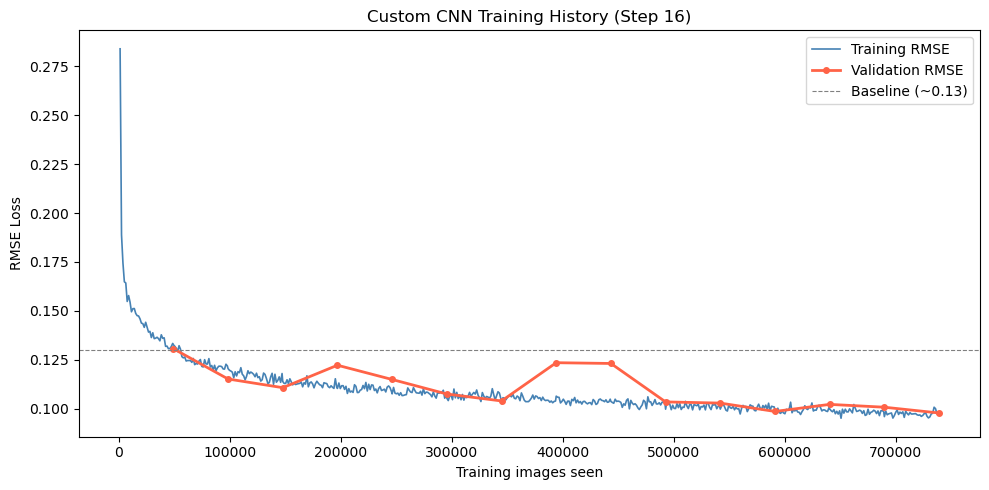

NameError: name 'best_val_loss' is not defined

In [19]:
import torch
import torch.nn as nn
 #CNN!!

class GalaxyCNN(nn.Module):
    """
    Custom CNN for galaxy morphology classification.

    The form of the model is as follows:
      - 4 convolutional blocks (Conv -> BatchNorm -> ReLU -> MaxPool)
      - 3 fully connected layers with Dropout for regularization
      - Sigmoid output to keep all 37 predictions in [0, 1]

    Input:  (batch, 3, 77, 77)
    Output: (batch, 37)
    """
    def __init__(self, num_labels=37, dropout_rate=0.5):
        super().__init__()

        # Each block: Conv2d -> BatchNorm -> ReLU -> MaxPool(2x2)
        # After each MaxPool the spatial size halves:
        #   77 -> 38 -> 19 -> 9 -> 4
        self.conv_blocks = nn.Sequential(

            # Block 1: 3 to 32 channels
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),          # 77 to 38

            # Block 2: 32 to 64 channels
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),          # 38 to 19

            # Block 3: 64 → 128 channels
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),          # 19 to 9

            # Block 4: 128 → 256 channels
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),          # 9 to 4
        )

        # Global average pooling collapses (256, 4, 4) to (256,)
        # This drastically reduces parameters vs. flattening
        self.global_avg_pool = nn.AdaptiveAvgPool2d(1)

        #  Fully connected layers 
        self.classifier = nn.Sequential(
            nn.Flatten(),

            nn.Linear(256, 512),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout_rate),

            nn.Linear(512, 256),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout_rate),

            nn.Linear(256, num_labels),
            nn.Sigmoid(),             # outputs in [0, 1]
        )

    def forward(self, x):
        x = self.conv_blocks(x)
        x = self.global_avg_pool(x)
        x = self.classifier(x)
        return x


#  Instantiate and inspect 

cnn_model = GalaxyCNN(num_labels=37, dropout_rate=0.5).to(device)

# Count trainable parameters
total_params = sum(p.numel() for p in cnn_model.parameters() if p.requires_grad)
print(f"Total trainable parameters: {total_params:,}")

# Sanity check: run a dummy batch through to confirm shapes are correct
dummy = torch.zeros(4, 3, 77, 77).to(device)
with torch.no_grad():
    out = cnn_model(dummy)
print(f"Output shape: {out.shape}")   # expect (4, 37)
"""

# Same training loop structure as before

NUM_EPOCHS = 30
LOG_INTERVAL = 10

cnn_train_history = []
cnn_val_history = []
images_seen = 0
best_val_loss = float("inf")

cnn_optimizer = torch.optim.Adam(cnn_model.parameters(), lr=1e-3)

for epoch in range(NUM_EPOCHS):
    cnn_model.train()
    running_loss      = 0.0
    batches_since_log = 0
    t0 = time.time()

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        cnn_optimizer.zero_grad()
        preds = cnn_model(images)
        loss  = rmse_loss(preds, labels)
        loss.backward()
        cnn_optimizer.step()

        images_seen += images.size(0)
        running_loss += loss.item()
        batches_since_log += 1

        if batches_since_log >= LOG_INTERVAL:
            cnn_train_history.append((images_seen, running_loss / batches_since_log))
            running_loss = 0.0
            batches_since_log = 0

    if batches_since_log > 0:
        cnn_train_history.append((images_seen, running_loss / batches_since_log))

    #  Validation 
    cnn_model.eval()
    total_val = 0.0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            total_val += rmse_loss(cnn_model(images), labels).item()

    val_loss = total_val / len(val_loader)
    cnn_val_history.append((images_seen, val_loss))

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save({
            "model_state":cnn_model.state_dict(),
            "optimizer_state":  cnn_optimizer.state_dict(),
            "epoch":epoch + 1,
            "best_val_loss":best_val_loss,
            "train_history": cnn_train_history,
            "val_history": cnn_val_history,
        }, "custom_cnn_best.pt")

    print(f"Epoch {epoch+1:02d}/{NUM_EPOCHS} | "
          f"Val RMSE: {val_loss:.4f} | "
          f"Best: {best_val_loss:.4f} | "
          f"{time.time()-t0:.1f}s")

"""
# Plot Loss Curve

train_x, train_y = zip(*cnn_train_history)
val_x,   val_y   = zip(*cnn_val_history)

fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(train_x, train_y, color="steelblue", linewidth=1.2, label="Training RMSE")
ax.plot(val_x, val_y, color="tomato", linewidth=2.0,
        marker="o", markersize=4, label="Validation RMSE")
ax.axhline(0.13, color="gray", linestyle="--", linewidth=0.8,
           label="Baseline (~0.13)")
ax.set_xlabel("Training images seen")
ax.set_ylabel("RMSE Loss")
ax.set_title("Custom CNN Training History (Step 16)")
ax.legend()
plt.tight_layout()
plt.savefig("custom_cnn_loss.png", dpi=150)
plt.show()

print(f"\nBest validation RMSE: {best_val_loss:.4f}")


In [20]:
import os
pts = [f for f in os.listdir(".") if f.endswith(".pt")]
print(pts)

['resnet18_galaxy.pt', 'custom_cnn_best.pt', 'resnet18_best.pt', 'resnet18_augmented_best.pt', 'resnet18_scheduled_best.pt']


In [21]:
def load_custom_cnn(path, device):
    checkpoint = torch.load(path, map_location=device)
    model = GalaxyCNN(num_labels=37).to(device)
    model.load_state_dict(checkpoint["model_state"])
    print(f"Loaded from epoch {checkpoint['epoch']}, "
          f"best val RMSE: {checkpoint['best_val_loss']:.4f}")
    return model, checkpoint["train_history"], checkpoint["val_history"]

cnn_model, cnn_train_history, cnn_val_history = load_custom_cnn("custom_cnn_best.pt", device)

Loaded from epoch 15, best val RMSE: 0.0978


In [22]:
# Count and compare trainable parameters 

def count_params(model):
    """Returns (trainable_params, total_params)."""
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    total = sum(p.numel() for p in model.parameters())
    return trainable, total


#  Parameter counts 

cnn_trainable, cnn_total = count_params(cnn_model)
resnet_trainable, resnet_total = count_params(model)   # model = your ResNet from step 15

print("=" * 55)
print(f"{'Model':<20} {'Trainable':>15} {'Total':>15}")
print("=" * 55)
print(f"{'Custom CNN':<20} {cnn_trainable:>15,} {cnn_total:>15,}")
print(f"{'ResNet-18':<20} {resnet_trainable:>15,} {resnet_total:>15,}")
print("=" * 55)


# ── Compare to number of pixels in compressed training set ───────────────────

n_train = len(train_df)
img_h, img_w = 77, 77
n_channels = 3
n_pixels_total = n_train * n_channels * img_h * img_w

print(f"\nTraining set pixel count : {n_pixels_total:,}")
print(f"Custom CNN params        : {cnn_trainable:,}  "
      f"({cnn_trainable / n_pixels_total:.2f}x pixel count)")
print(f"ResNet-18 params         : {resnet_trainable:,}  "
      f"({resnet_trainable / n_pixels_total:.2f}x pixel count)")


#  Layer-by-layer breakdown for the custom CNN 

print("\n--- Custom CNN layer breakdown ---")
for name, p in cnn_model.named_parameters():
    if p.requires_grad:
        print(f"  {name:<45} {p.numel():>10,}")

Model                      Trainable           Total
Custom CNN                   661,797         661,797
ResNet-18                 11,187,813      11,187,813

Training set pixel count : 876,223,194
Custom CNN params        : 661,797  (0.00x pixel count)
ResNet-18 params         : 11,187,813  (0.01x pixel count)

--- Custom CNN layer breakdown ---
  conv_blocks.0.weight                                 864
  conv_blocks.0.bias                                    32
  conv_blocks.1.weight                                  32
  conv_blocks.1.bias                                    32
  conv_blocks.4.weight                              18,432
  conv_blocks.4.bias                                    64
  conv_blocks.5.weight                                  64
  conv_blocks.5.bias                                    64
  conv_blocks.8.weight                              73,728
  conv_blocks.8.bias                                   128
  conv_blocks.9.weight                                 128
 

In [23]:
# Picking the best mdoel

# Load both best checkpoints and compare their validation losses
resnet_checkpoint = torch.load("resnet18_best.pt",   map_location=device)
cnn_checkpoint = torch.load("custom_cnn_best.pt", map_location=device)

resnet_best_val = resnet_checkpoint["best_val_loss"]
cnn_best_val = cnn_checkpoint["best_val_loss"]

print(f"ResNet-18 best val RMSE : {resnet_best_val:.4f}")
print(f"Custom CNN best val RMSE: {cnn_best_val:.4f}")

# Load whichever was better as `best_model`
if resnet_best_val <= cnn_best_val:
    best_model = build_resnet(num_labels=37).to(device)
    best_model.load_state_dict(resnet_checkpoint["model_state"])
    best_model_name = "ResNet-18"
else:
    best_model = GalaxyCNN(num_labels=37).to(device)
    best_model.load_state_dict(cnn_checkpoint["model_state"])
    best_model_name = "Custom CNN"

print(f"\nUsing {best_model_name} for remainder of lab.")

ResNet-18 best val RMSE : 0.0950
Custom CNN best val RMSE: 0.0978

Using ResNet-18 for remainder of lab.


In [24]:
"""
NUM_EPOCHS = 23    # more epochs since the scheduler will squeeze out extra improvement
LOG_INTERVAL = 10

# Fresh model and optimizer
scheduled_model = build_resnet(num_labels=37).to(device)
scheduled_optimizer = torch.optim.Adam(scheduled_model.parameters(), lr=1e-3)

# ReduceLROnPlateau: multiply LR by `factor` whenever val loss hasn't improved for `patience` epochs. A good starting point is factor=0.5, patience=3.
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    scheduled_optimizer,
    mode     = "min",
    factor   = 0.5,
    patience = 3,
)
sched_train_history = []
sched_val_history = []
lr_history = []   # track LR so we can annotate the plot
images_seen = 0
best_val_loss = float("inf")

for epoch in range(NUM_EPOCHS):
    scheduled_model.train()
    running_loss = 0.0
    batches_since_log = 0
    t0 = time.time()

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        scheduled_optimizer.zero_grad()
        preds = scheduled_model(images)
        loss  = rmse_loss(preds, labels)
        loss.backward()
        scheduled_optimizer.step()

        images_seen += images.size(0)
        running_loss += loss.item()
        batches_since_log += 1

        if batches_since_log >= LOG_INTERVAL:
            sched_train_history.append((images_seen, running_loss / batches_since_log))
            running_loss      = 0.0
            batches_since_log = 0

    if batches_since_log > 0:
        sched_train_history.append((images_seen, running_loss / batches_since_log))

    #  Validation 
    scheduled_model.eval()
    total_val = 0.0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            total_val += rmse_loss(scheduled_model(images), labels).item()

    val_loss = total_val / len(val_loader)
    current_lr = scheduled_optimizer.param_groups[0]["lr"]

    sched_val_history.append((images_seen, val_loss))
    lr_history.append((images_seen, current_lr))

    # Step the scheduler — pass the validation loss
    scheduler.step(val_loss)

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save({
            "model_state": scheduled_model.state_dict(),
            "optimizer_state":   scheduled_optimizer.state_dict(),
            "scheduler_state": scheduler.state_dict(),
            "epoch": epoch + 1,
            "best_val_loss": best_val_loss,
            "train_history": sched_train_history,
            "val_history": sched_val_history,
            "lr_history": lr_history,
        }, "resnet18_scheduled_best.pt")

    print(f"Epoch {epoch+1:02d}/{NUM_EPOCHS} | "
          f"Val RMSE: {val_loss:.4f} | "
          f"Best: {best_val_loss:.4f} | "
          f"LR: {current_lr:.2e} | "
          f"{time.time()-t0:.1f}s")

print(f"\nBest validation RMSE: {best_val_loss:.4f}")
"""

'\nNUM_EPOCHS = 23    # more epochs since the scheduler will squeeze out extra improvement\nLOG_INTERVAL = 10\n\n# Fresh model and optimizer\nscheduled_model = build_resnet(num_labels=37).to(device)\nscheduled_optimizer = torch.optim.Adam(scheduled_model.parameters(), lr=1e-3)\n\n# ReduceLROnPlateau: multiply LR by `factor` whenever val loss hasn\'t improved for `patience` epochs. A good starting point is factor=0.5, patience=3.\nscheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(\n    scheduled_optimizer,\n    mode     = "min",\n    factor   = 0.5,\n    patience = 3,\n)\nsched_train_history = []\nsched_val_history = []\nlr_history = []   # track LR so we can annotate the plot\nimages_seen = 0\nbest_val_loss = float("inf")\n\nfor epoch in range(NUM_EPOCHS):\n    scheduled_model.train()\n    running_loss = 0.0\n    batches_since_log = 0\n    t0 = time.time()\n\n    for images, labels in train_loader:\n        images, labels = images.to(device), labels.to(device)\n\n        scheduled

In [25]:
#  Plot loss curves with LR reduction events annotated 

train_x, train_y = zip(*sched_train_history)
val_x, val_y   = zip(*sched_val_history)
lr_x, lr_vals = zip(*lr_history)

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

#loss curves
ax1.plot(train_x, train_y, color="steelblue", linewidth=1.2, label="Training RMSE")
ax1.plot(val_x,   val_y,   color="tomato",    linewidth=2.0,
         marker="o", markersize=4, label="Validation RMSE")
ax1.axhline(0.13, color="gray", linestyle="--", linewidth=0.8, label="Baseline (~0.13)")

# Mark each point where the LR was reduced
lr_array = np.array(lr_vals)
drops    = np.where(lr_array[1:] < lr_array[:-1])[0] + 1  # indices where LR dropped
for i, drop_idx in enumerate(drops):
    ax1.axvline(lr_x[drop_idx], color="green", linestyle=":", linewidth=1.2,
                label="LR reduced" if i == 0 else "")

ax1.set_ylabel("RMSE Loss")
ax1.set_title("ResNet-18 with LR Scheduler")
ax1.legend()

# learning rate over time 
ax2.plot(lr_x, lr_vals, color="purple", linewidth=1.5, drawstyle="steps-post")
ax2.set_ylabel("Learning Rate")
ax2.set_xlabel("Training images seen")
ax2.set_yscale("log")   # log scale makes the step-downs clearly visible

plt.tight_layout()
plt.savefig("resnet18_scheduled_loss.png", dpi=150)
plt.show()

NameError: name 'sched_train_history' is not defined

In [26]:
#  Loading this model back later 

def load_scheduled_resnet(path, device):
    checkpoint = torch.load(path, map_location=device)
    model      = build_resnet(num_labels=37).to(device)
    model.load_state_dict(checkpoint["model_state"])
    print(f"Loaded from epoch {checkpoint['epoch']}, "
          f"best val RMSE: {checkpoint['best_val_loss']:.4f}")
    return model, checkpoint["train_history"], checkpoint["val_history"], checkpoint["lr_history"]

scheduled_model, sched_train_history, sched_val_history, lr_history = \
    load_scheduled_resnet("resnet18_scheduled_best.pt", device)

Loaded from epoch 18, best val RMSE: 0.0932


Augmented train loader: 385 batches
Validation loader : 97 batches


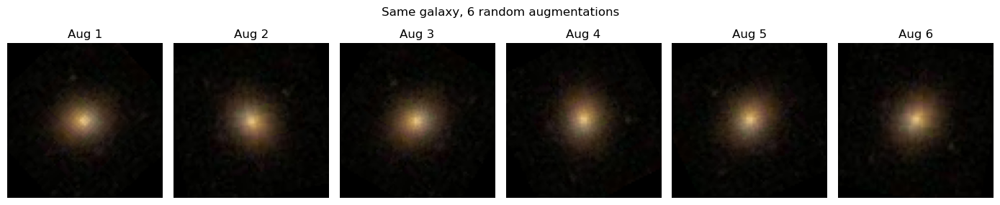

In [27]:
import torchvision.transforms.functional as TF
import random

# Augmented Data set

class GalaxyDatasetAugmented(Dataset):
    """
    Same as GalaxyDataset but applies random rotation + random horizontal/vertical flips during training.

    Galaxy labels are invariant to rotation and reflection — a spiral galaxy rotated 90° is still the same spiral galaxy.
    Setting augment=True means the model effectively never sees the same image twice across epochs.
    """
    def __init__(self, dataframe, image_dir, label_columns, augment=False):
        self.df = dataframe.reset_index(drop=True)
        self.image_dir = image_dir
        self.label_cols = label_columns
        self.augment = augment
        self.id_col = self.df.columns[0]

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        galaxy_id = int(row[self.id_col])
        img_path = os.path.join(self.image_dir, f"{galaxy_id}.jpg")

        img = Image.open(img_path).convert("RGB")

        # image augmentation
        if self.augment:
            # Random rotation: uniform over full [0, 360) degrees
            angle = random.uniform(0, 360)
            img = TF.rotate(img, angle)

            # Random horizontal and vertical flips (each with 50% probability)
            # Combined with rotation this covers all 8 dihedral symmetries
            if random.random() > 0.5:
                img = TF.hflip(img)
            if random.random() > 0.5:
                img = TF.vflip(img)

        # Convert to tensor 
        img_tensor = torch.tensor(
            np.array(img), dtype=torch.float32
        ).permute(2, 0, 1) / 255.0   # (H,W,C) → (C,H,W), scaled to [0,1]

        labels = torch.tensor(
            row[self.label_cols].values.astype(np.float32)
        )

        return img_tensor, labels


#  Rebuild loaders — augmentation ON for train, OFF for val 
# Validation must never be augmente because we want a consistent, reproducible measurement of model performance on unmodified images.

train_dataset_aug = GalaxyDatasetAugmented(
    train_df, DOWNSIZED_DIR, label_columns, augment=True
)
val_dataset_aug = GalaxyDatasetAugmented(
    val_df, DOWNSIZED_DIR, label_columns, augment=False
)

train_loader_aug = DataLoader(
    train_dataset_aug,
    batch_size  = BATCH_SIZE,
    shuffle = True,
    num_workers = 0,
    pin_memory = False,
)
val_loader_aug = DataLoader(
    val_dataset_aug,
    batch_size = BATCH_SIZE,
    shuffle = False,
    num_workers = 0,
    pin_memory = False,
)

print(f"Augmented train loader: {len(train_loader_aug)} batches")
print(f"Validation loader : {len(val_loader_aug)} batches")


#  Quick visual sanity check 
# Confirm augmentation is working by plotting the same galaxy 6 times.
# Each render should look different (rotated/flipped).

sample_dataset = GalaxyDatasetAugmented(
    train_df.iloc[:1], DOWNSIZED_DIR, label_columns, augment=True
)

fig, axes = plt.subplots(1, 6, figsize=(14, 3))
for i in range(6):
    img, _ = sample_dataset[0]
    axes[i].imshow(img.permute(1, 2, 0).numpy())   # (C,H,W) -> (H,W,C) for imshow
    axes[i].axis("off")
    axes[i].set_title(f"Aug {i+1}")

fig.suptitle("Same galaxy, 6 random augmentations")
plt.tight_layout()
plt.savefig("augmentation_examples.png", dpi=150)
plt.show()

Augmented train loader: 385 batches
Validation loader : 97 batches


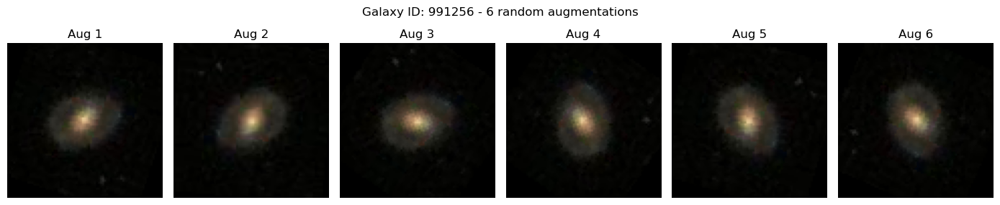

In [28]:
import torchvision.transforms.functional as TF
import random
import os
from PIL import Image
import torch
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader

# Augmented Data set
class GalaxyDatasetAugmented(Dataset):
    """
    Same as GalaxyDataset but applies random rotation + random horizontal/vertical flips during training.

    Galaxy labels are invariant to rotation and reflection — a spiral galaxy rotated 90° is still the same spiral galaxy.
    Setting augment=True means the model effectively never sees the same image twice across epochs.
    """
    def __init__(self, dataframe, image_dir, label_columns, augment=False):
        self.df = dataframe.reset_index(drop=True)
        self.image_dir = image_dir
        self.label_cols = label_columns
        self.augment = augment
        self.id_col = self.df.columns[0]

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        galaxy_id = int(row[self.id_col])
        img_path = os.path.join(self.image_dir, f"{galaxy_id}.jpg")

        img = Image.open(img_path).convert("RGB")

        # image augmentation
        if self.augment:
            # Random rotation: uniform over full [0, 360) degrees
            angle = random.uniform(0, 360)
            img = TF.rotate(img, angle)

            # Random horizontal and vertical flips (each with 50% probability)
            # Combined with rotation this covers all 8 dihedral symmetries
            if random.random() > 0.5:
                img = TF.hflip(img)
            if random.random() > 0.5:
                img = TF.vflip(img)

        # Convert to tensor 
        img_tensor = torch.tensor(
            np.array(img), dtype=torch.float32
        ).permute(2, 0, 1) / 255.0   # (H,W,C) -> (C,H,W), scaled to [0,1]

        labels = torch.tensor(
            row[self.label_cols].values.astype(np.float32)
        )

        return img_tensor, labels

# Rebuild loaders — augmentation ON for train, OFF for val 
# Validation must never be augmented because we want a consistent, reproducible measurement of model performance on unmodified images.
train_dataset_aug = GalaxyDatasetAugmented(
    train_df, DOWNSIZED_DIR, label_columns, augment=True
)
val_dataset_aug = GalaxyDatasetAugmented(
    val_df, DOWNSIZED_DIR, label_columns, augment=False
)

train_loader_aug = DataLoader(
    train_dataset_aug,
    batch_size  = BATCH_SIZE,
    shuffle = True,
    num_workers = 0,
    pin_memory = False,
)
val_loader_aug = DataLoader(
    val_dataset_aug,
    batch_size = BATCH_SIZE,
    shuffle = False,
    num_workers = 0,
    pin_memory = False,
)

print(f"Augmented train loader: {len(train_loader_aug)} batches")
print(f"Validation loader : {len(val_loader_aug)} batches")

# Quick visual sanity check 
# Confirm augmentation is working by plotting a RANDOM galaxy 6 times.
# Each render should look different (rotated/flipped).

# 1. Pick a random index from the training dataframe
random_idx = random.randint(0, len(train_df) - 1)

# 2. Slice the dataframe at that random index to create a 1-row dataset
sample_dataset = GalaxyDatasetAugmented(
    train_df.iloc[random_idx:random_idx+1], DOWNSIZED_DIR, label_columns, augment=True
)

fig, axes = plt.subplots(1, 6, figsize=(14, 3))
for i in range(6):
    img, _ = sample_dataset[0]
    axes[i].imshow(img.permute(1, 2, 0).numpy())   # (C,H,W) -> (H,W,C) for imshow
    axes[i].axis("off")
    axes[i].set_title(f"Aug {i+1}")

# Get the galaxy ID for the plot title so you know which one was picked!
random_galaxy_id = train_df.iloc[random_idx][train_df.columns[0]]
fig.suptitle(f"Galaxy ID: {int(random_galaxy_id)} - 6 random augmentations")

plt.tight_layout()
plt.savefig("augmentation_examples.png", dpi=150)
plt.show()

In [29]:
"""
#  Retrain ResNet-18 with augmentation + LR scheduler 

NUM_EPOCHS = 23
LOG_INTERVAL = 10

aug_model = build_resnet(num_labels=37).to(device)
aug_optimizer = torch.optim.Adam(aug_model.parameters(), lr=1e-3)
aug_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    aug_optimizer,
    mode = "min",
    factor = 0.5,
    patience = 3,
)

aug_train_history = []
aug_val_history = []
aug_lr_history = []
images_seen = 0
best_val_loss = float("inf")

for epoch in range(NUM_EPOCHS):
    aug_model.train()
    running_loss = 0.0
    batches_since_log = 0
    t0 = time.time()

    for images, labels in train_loader_aug:       # ← augmented loader
        images, labels = images.to(device), labels.to(device)

        aug_optimizer.zero_grad()
        preds = aug_model(images)
        loss  = rmse_loss(preds, labels)
        loss.backward()
        aug_optimizer.step()

        images_seen += images.size(0)
        running_loss += loss.item()
        batches_since_log += 1

        if batches_since_log >= LOG_INTERVAL:
            aug_train_history.append((images_seen, running_loss / batches_since_log))
            running_loss      = 0.0
            batches_since_log = 0

    if batches_since_log > 0:
        aug_train_history.append((images_seen, running_loss / batches_since_log))

    # validaiton
    aug_model.eval()
    total_val = 0.0
    with torch.no_grad():
        for images, labels in val_loader_aug:     # unaugmented loader
            images, labels = images.to(device), labels.to(device)
            total_val += rmse_loss(aug_model(images), labels).item()

    val_loss = total_val / len(val_loader_aug)
    current_lr = aug_optimizer.param_groups[0]["lr"]

    aug_val_history.append((images_seen, val_loss))
    aug_lr_history.append((images_seen, current_lr))

    aug_scheduler.step(val_loss)

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save({
            "model_state": aug_model.state_dict(),
            "optimizer_state": aug_optimizer.state_dict(),
            "scheduler_state": aug_scheduler.state_dict(),
            "epoch": epoch + 1,
            "best_val_loss": best_val_loss,
            "train_history": aug_train_history,
            "val_history": aug_val_history,
            "lr_history": aug_lr_history,
        }, "resnet18_augmented_best.pt")

    print(f"Epoch {epoch+1:02d}/{NUM_EPOCHS} | "
          f"Val RMSE: {val_loss:.4f} | "
          f"Best: {best_val_loss:.4f} | "
          f"LR: {current_lr:.2e} | "
          f"{time.time()-t0:.1f}s")

print(f"\nBest validation RMSE: {best_val_loss:.4f}")
"""

'\n#  Retrain ResNet-18 with augmentation + LR scheduler \n\nNUM_EPOCHS = 23\nLOG_INTERVAL = 10\n\naug_model = build_resnet(num_labels=37).to(device)\naug_optimizer = torch.optim.Adam(aug_model.parameters(), lr=1e-3)\naug_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(\n    aug_optimizer,\n    mode = "min",\n    factor = 0.5,\n    patience = 3,\n)\n\naug_train_history = []\naug_val_history = []\naug_lr_history = []\nimages_seen = 0\nbest_val_loss = float("inf")\n\nfor epoch in range(NUM_EPOCHS):\n    aug_model.train()\n    running_loss = 0.0\n    batches_since_log = 0\n    t0 = time.time()\n\n    for images, labels in train_loader_aug:       # ← augmented loader\n        images, labels = images.to(device), labels.to(device)\n\n        aug_optimizer.zero_grad()\n        preds = aug_model(images)\n        loss  = rmse_loss(preds, labels)\n        loss.backward()\n        aug_optimizer.step()\n\n        images_seen += images.size(0)\n        running_loss += loss.item()\n        ba

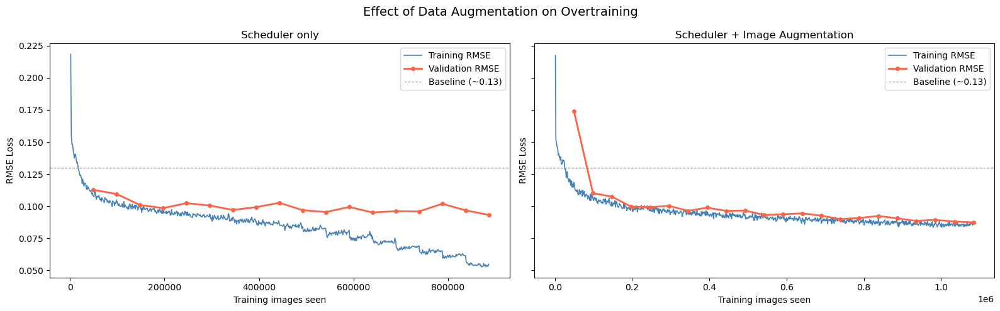

In [30]:
#  Plot to compare overtraining before and after augmentation 

fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=True)

for ax, train_h, val_h, title in [
    (axes[0], sched_train_history, sched_val_history, "Scheduler only"),
    (axes[1], aug_train_history,   aug_val_history,   "Scheduler + Image Augmentation"),
]:
    tx, ty = zip(*train_h)
    vx, vy = zip(*val_h)
    ax.plot(tx, ty, color="steelblue", linewidth=1.2, label="Training RMSE")
    ax.plot(vx, vy, color="tomato", linewidth=2.0,
            marker="o", markersize=4, label="Validation RMSE")
    ax.axhline(0.13, color="gray", linestyle="--", linewidth=0.8,
               label="Baseline (~0.13)")
    ax.set_xlabel("Training images seen")
    ax.set_ylabel("RMSE Loss")
    ax.set_title(title)
    ax.legend()

plt.suptitle("Effect of Data Augmentation on Overtraining", fontsize=14)
plt.tight_layout()
plt.savefig("augmentation_comparison.png", dpi=150)
plt.show()

In [31]:
# Loading back later 

def load_augmented_resnet(path, device):
    checkpoint = torch.load(path, map_location=device)
    model      = build_resnet(num_labels=37).to(device)
    model.load_state_dict(checkpoint["model_state"])
    print(f"Loaded from epoch {checkpoint['epoch']}, "
          f"best val RMSE: {checkpoint['best_val_loss']:.4f}")
    return model, checkpoint["train_history"], checkpoint["val_history"]

aug_model, aug_train_history, aug_val_history = \
    load_augmented_resnet("resnet18_augmented_best.pt", device)

Loaded from epoch 22, best val RMSE: 0.0874


In [32]:
import torch
print(torch.__version__)



2.11.0


In [33]:
pip show pytorch-lightning


Name: pytorch-lightning
Version: 1.9.5
Summary: PyTorch Lightning is the lightweight PyTorch wrapper for ML researchers. Scale your models. Write less boilerplate.
Home-page: https://github.com/Lightning-AI/lightning
Author: Lightning AI et al.
Author-email: pytorch@lightning.ai
License: Apache-2.0
Location: /opt/anaconda3/lib/python3.13/site-packages
Requires: fsspec, lightning-utilities, numpy, packaging, PyYAML, torch, torchmetrics, tqdm, typing-extensions
Required-by: lightning-bolts
Note: you may need to restart the kernel to use updated packages.


In [34]:
print("resnet keys:", list(resnet_ckpt.keys()))
print("cnn keys:   ", list(cnn_ckpt.keys()))
print("aug keys:   ", list(aug_ckpt.keys()))

resnet keys: ['model_state', 'optimizer_state', 'epoch', 'best_val_loss', 'train_loss_history', 'val_loss_history']
cnn keys:    ['model_state', 'optimizer_state', 'epoch', 'best_val_loss', 'train_history', 'val_history']
aug keys:    ['model_state', 'optimizer_state', 'scheduler_state', 'epoch', 'best_val_loss', 'train_history', 'val_history', 'lr_history']


In [35]:
#  Recover all history variables from saved checkpoints 
import torch

device = (
    torch.device("mps")  if torch.backends.mps.is_available()
    else torch.device("cuda") if torch.cuda.is_available()
    else torch.device("cpu")
)

#  Load all three checkpoints 
resnet_ckpt = torch.load("resnet18_best.pt", map_location=device)
cnn_ckpt = torch.load("custom_cnn_best.pt", map_location=device)
aug_ckpt = torch.load("resnet18_augmented_best.pt", map_location=device)

#  Restore history variables 

train_loss_history = resnet_ckpt["train_loss_history"]
val_loss_history = resnet_ckpt["val_loss_history"]

cnn_train_history = cnn_ckpt["train_history"]
cnn_val_history = cnn_ckpt["val_history"]

aug_train_history  = aug_ckpt["train_history"]
aug_val_history = aug_ckpt["val_history"]
aug_lr_history = aug_ckpt["lr_history"]

#Restore models 
model = build_resnet(num_labels=37).to(device)
model.load_state_dict(resnet_ckpt["model_state"])

cnn_model = GalaxyCNN(num_labels=37).to(device)
cnn_model.load_state_dict(cnn_ckpt["model_state"])

aug_model = build_resnet(num_labels=37).to(device)
aug_model.load_state_dict(aug_ckpt["model_state"])

# Confirm everything loaded correctly 
print(f"ResNet-18       — best val RMSE: {resnet_ckpt['best_val_loss']:.4f}, "
      f"epoch: {resnet_ckpt['epoch']}")
print(f"Custom CNN      — best val RMSE: {cnn_ckpt['best_val_loss']:.4f}, "
      f"epoch: {cnn_ckpt['epoch']}")
print(f"Augmented ResNet— best val RMSE: {aug_ckpt['best_val_loss']:.4f}, "
      f"epoch: {aug_ckpt['epoch']}")

ResNet-18       — best val RMSE: 0.0950, epoch: 15
Custom CNN      — best val RMSE: 0.0978, epoch: 15
Augmented ResNet— best val RMSE: 0.0874, epoch: 22


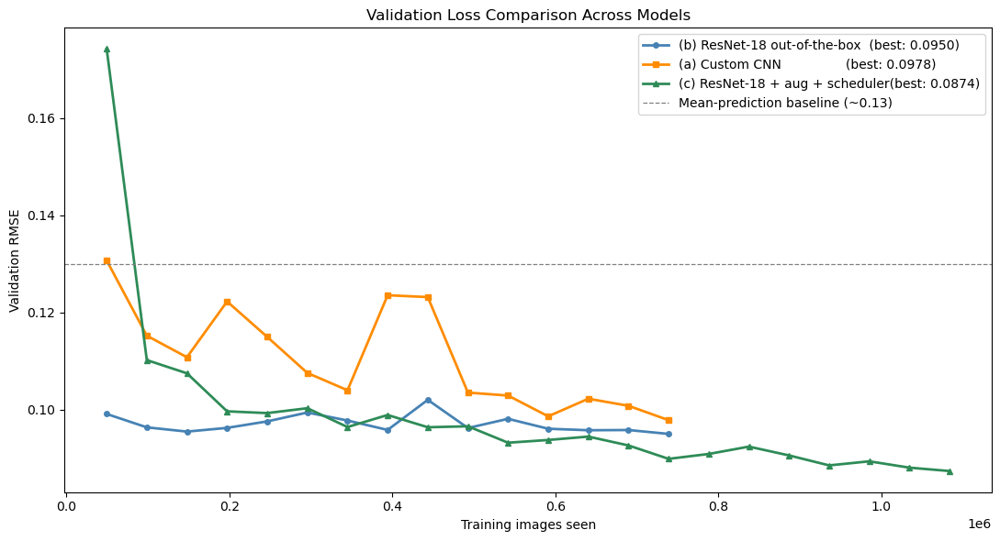

Model                               Best Val RMSE
(a) Custom CNN                            0.0978
(b) ResNet-18 (out-of-the-box)            0.0950
(c) ResNet-18 + aug + scheduler           0.0874
Baseline (mean prediction)                 ~0.13


In [36]:
# Compare validation loss across all three models 

#  Load histories from checkpoints 

resnet_ckpt = torch.load("resnet18_best.pt", map_location=device)
cnn_ckpt = torch.load("custom_cnn_best.pt", map_location=device)
aug_ckpt = torch.load("resnet18_augmented_best.pt", map_location=device)

# Unpack validation histories — list of (images_seen, val_loss) tuples
resnet_val_history = resnet_ckpt["val_loss_history"]
cnn_val_history = cnn_ckpt["val_history"]
aug_val_history = aug_ckpt["val_history"]

#  Plot 

fig, ax = plt.subplots(figsize=(11, 6))

# Each history is a list of (images_seen, loss) pairs
rx, ry = zip(*resnet_val_history)
cx, cy = zip(*cnn_val_history)
ax_x, ay = zip(*aug_val_history)

ax.plot(rx,  ry,  color="steelblue", linewidth=2.0,
        marker="o", markersize=4, label=f"(b) ResNet-18 out-of-the-box  "
                                        f"(best: {min(ry):.4f})")
ax.plot(cx,  cy,  color="darkorange", linewidth=2.0,
        marker="s", markersize=4, label=f"(a) Custom CNN                "
                                        f"(best: {min(cy):.4f})")
ax.plot(ax_x, ay, color="seagreen",  linewidth=2.0,
        marker="^", markersize=4, label=f"(c) ResNet-18 + aug + scheduler"
                                        f"(best: {min(ay):.4f})")

ax.axhline(0.13, color="gray", linestyle="--", linewidth=0.9,
           label="Mean-prediction baseline (~0.13)")

ax.set_xlabel("Training images seen")
ax.set_ylabel("Validation RMSE")
ax.set_title("Validation Loss Comparison Across Models")
ax.legend(loc="upper right")
plt.tight_layout()
plt.savefig("step23_model_comparison.png", dpi=150)
plt.show()

#  Summary table 

print("=" * 50)
print(f"{'Model':<35} {'Best Val RMSE':>12}")
print("=" * 50)
print(f"{'(a) Custom CNN':<35} {min(cy):>12.4f}")
print(f"{'(b) ResNet-18 (out-of-the-box)':<35} {min(ry):>12.4f}")
print(f"{'(c) ResNet-18 + aug + scheduler':<35} {min(ay):>12.4f}")
print(f"{'Baseline (mean prediction)':<35} {'~0.13':>12}")
print("=" * 50)

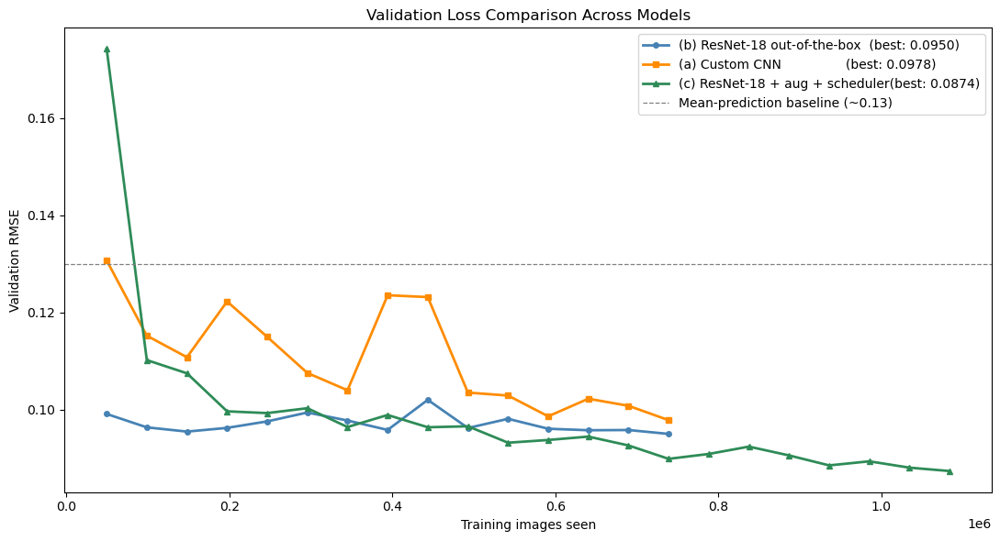

Model                               Best Val RMSE
(a) Custom CNN                            0.0978
(b) ResNet-18 (out-of-the-box)            0.0950
(c) ResNet-18 + aug + scheduler           0.0874
Baseline (mean prediction)                 ~0.13


In [37]:
# Compare validation loss across all three models 

#  Load histories from checkpoints 

resnet_ckpt = torch.load("resnet18_best.pt", map_location=device)
cnn_ckpt = torch.load("custom_cnn_best.pt", map_location=device)
aug_ckpt = torch.load("resnet18_augmented_best.pt", map_location=device)

# Unpack validation histories — list of (images_seen, val_loss) tuples
resnet_val_history = resnet_ckpt["val_loss_history"]
cnn_val_history = cnn_ckpt["val_history"]
aug_val_history = aug_ckpt["val_history"]

#  Plot 

fig, ax = plt.subplots(figsize=(11, 6))

# Each history is a list of (images_seen, loss) pairs
rx, ry = zip(*resnet_val_history)
cx, cy = zip(*cnn_val_history)
ax_x, ay = zip(*aug_val_history)

ax.plot(rx,  ry,  color="steelblue", linewidth=2.0,
        marker="o", markersize=4, label=f"(b) ResNet-18 out-of-the-box  "
                                        f"(best: {min(ry):.4f})")
ax.plot(cx,  cy,  color="darkorange", linewidth=2.0,
        marker="s", markersize=4, label=f"(a) Custom CNN                "
                                        f"(best: {min(cy):.4f})")
ax.plot(ax_x, ay, color="seagreen",  linewidth=2.0,
        marker="^", markersize=4, label=f"(c) ResNet-18 + aug + scheduler"
                                        f"(best: {min(ay):.4f})")

ax.axhline(0.13, color="gray", linestyle="--", linewidth=0.9,
           label="Mean-prediction baseline (~0.13)")

ax.set_xlabel("Training images seen")
ax.set_ylabel("Validation RMSE")
ax.set_title("Validation Loss Comparison Across Models")
ax.legend(loc="upper right")
plt.tight_layout()
plt.savefig("step23_model_comparison.png", dpi=150)
plt.show()

#  Summary table 

print("=" * 50)
print(f"{'Model':<35} {'Best Val RMSE':>12}")
print("=" * 50)
print(f"{'(a) Custom CNN':<35} {min(cy):>12.4f}")
print(f"{'(b) ResNet-18 (out-of-the-box)':<35} {min(ry):>12.4f}")
print(f"{'(c) ResNet-18 + aug + scheduler':<35} {min(ay):>12.4f}")
print(f"{'Baseline (mean prediction)':<35} {'~0.13':>12}")
print("=" * 50)

Collected predictions for 12316 validation galaxies


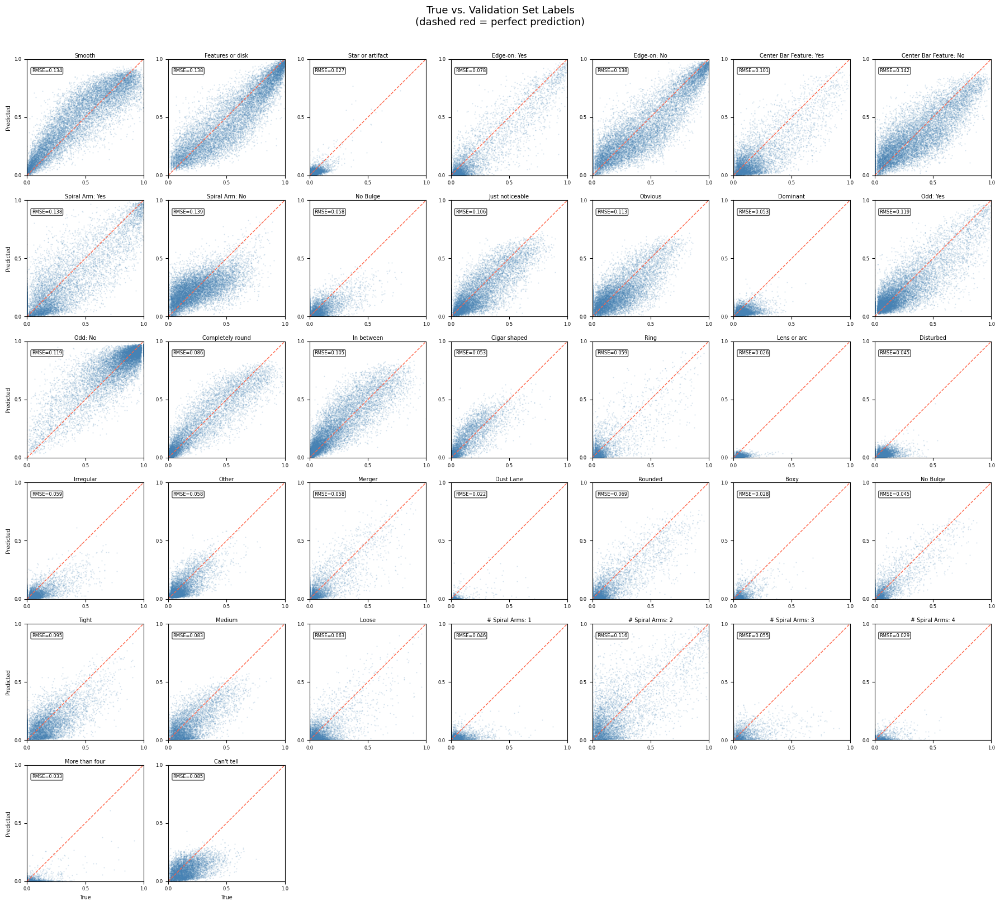


── 5 easiest labels (lowest RMSE) ───────────────────────────────
    Class            Label  Val RMSE
 Class8.7        Dust Lane  0.022476
 Class8.2      Lens or arc  0.026179
 Class1.3 Star or artifact  0.027095
 Class9.2             Boxy  0.027672
Class11.4 # Spiral Arms: 4  0.029493

── 5 hardest labels (highest RMSE) ──────────────────────────────
   Class                  Label  Val RMSE
Class4.1        Spiral Arm: Yes  0.137562
Class2.2            Edge-on: No  0.137565
Class1.2       Features or disk  0.137997
Class4.2         Spiral Arm: No  0.139000
Class3.2 Center Bar Feature: No  0.141937

Overall validation RMSE: 0.0875


In [38]:
# Scatter plot of true vs. validation set labels

# Collect all predictions on the validation set 
# Using the best model —> swap aug_model for whichever had the lowest val RMSE

best_model = aug_model   # change to `model` or `cnn_model` if either was better
best_model.eval()

all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in val_loader_aug:   # unaugmented val loader
        images = images.to(device)
        preds = best_model(images).cpu().numpy()
        all_preds.append(preds)
        all_labels.append(labels.numpy())

all_preds = np.concatenate(all_preds,  axis=0)  # (N_val, 37)
all_labels = np.concatenate(all_labels, axis=0)  # (N_val, 37)

print(f"Collected predictions for {len(all_preds)} validation galaxies")


# Scatter plot

ncols = 7
nrows = 6   # 7 * 6 = 42 panels, last 5 will be empty

fig, axes = plt.subplots(nrows, ncols, figsize=(18, 16))
axes = axes.flatten()

for i, col in enumerate(label_columns):
    ax = axes[i]
    true = all_labels[:, i]
    pred = all_preds[:, i]
    name = label_mapping.get(col, col)

    # Scatter with low alpha to handle overplotting
    ax.scatter(true, pred, s=0.5, alpha=0.15, color="steelblue", rasterized=True)

    # Perfect-prediction reference line
    ax.plot([0, 1], [0, 1], color="tomato", linewidth=1.0, linestyle="--")

    # Per-label RMSE in the corner
    label_rmse = np.sqrt(np.mean((true - pred) ** 2))
    ax.text(0.04, 0.92, f"RMSE={label_rmse:.3f}",
            transform=ax.transAxes, fontsize=6,
            verticalalignment="top", color="black",
            bbox=dict(boxstyle="round,pad=0.2", facecolor="white", alpha=0.7))

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.set_title(name, fontsize=7, pad=2)
    ax.set_xticks([0, 0.5, 1])
    ax.set_yticks([0, 0.5, 1])
    ax.tick_params(labelsize=6)

# Label outer axes only to avoid clutter
for ax in axes[nrows*ncols - ncols : nrows*ncols]:
    ax.set_xlabel("True", fontsize=7)
for ax in axes[::ncols]:
    ax.set_ylabel("Predicted", fontsize=7)

# Hide unused panels
for j in range(len(label_columns), len(axes)):
    axes[j].set_visible(False)

fig.suptitle("True vs. Validation Set Labels\n"
             "(dashed red = perfect prediction)", fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig("step24_scatter.png", dpi=150, bbox_inches="tight")
plt.show()


# Rank labels by RMSE to identify best/worst 

per_label_rmse = np.sqrt(np.mean((all_labels - all_preds) ** 2, axis=0))
rmse_df = (
    pd.DataFrame({
        "Class": label_columns,
        "Label": [label_mapping.get(c, c) for c in label_columns],
        "Val RMSE": per_label_rmse,
    })
    .sort_values("Val RMSE")
    .reset_index(drop=True)
)

print("\n── 5 easiest labels (lowest RMSE) ───────────────────────────────")
print(rmse_df.head(5).to_string(index=False))

print("\n── 5 hardest labels (highest RMSE) ──────────────────────────────")
print(rmse_df.tail(5).to_string(index=False))

print(f"\nOverall validation RMSE: {np.sqrt(np.mean((all_labels - all_preds)**2)):.4f}")

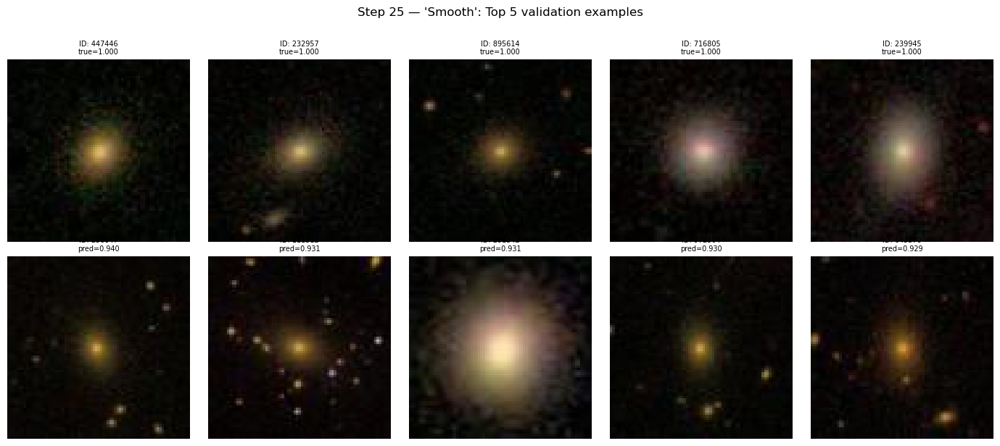

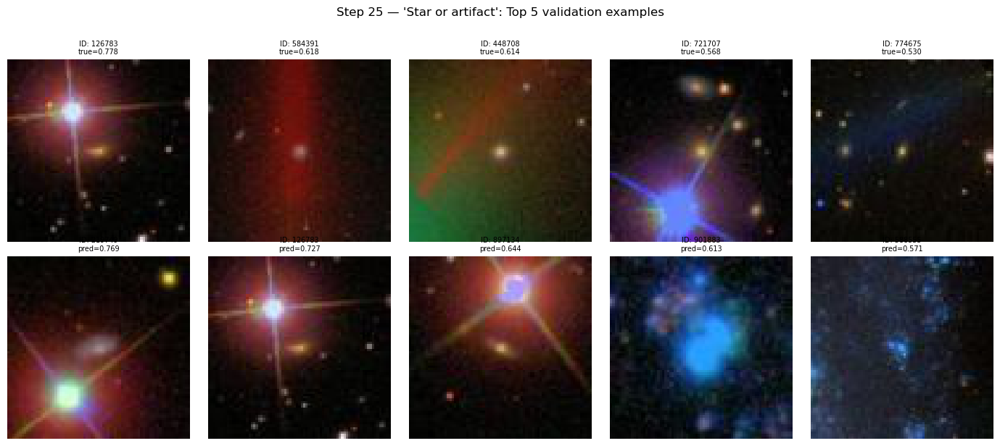

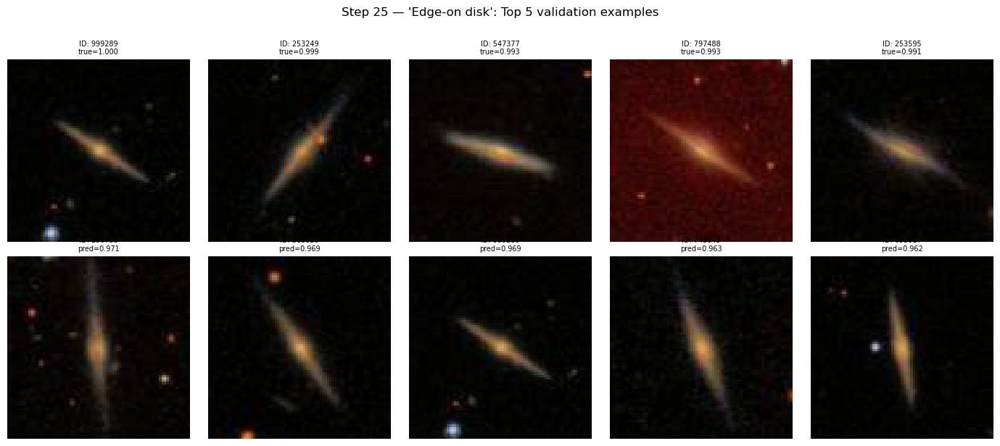

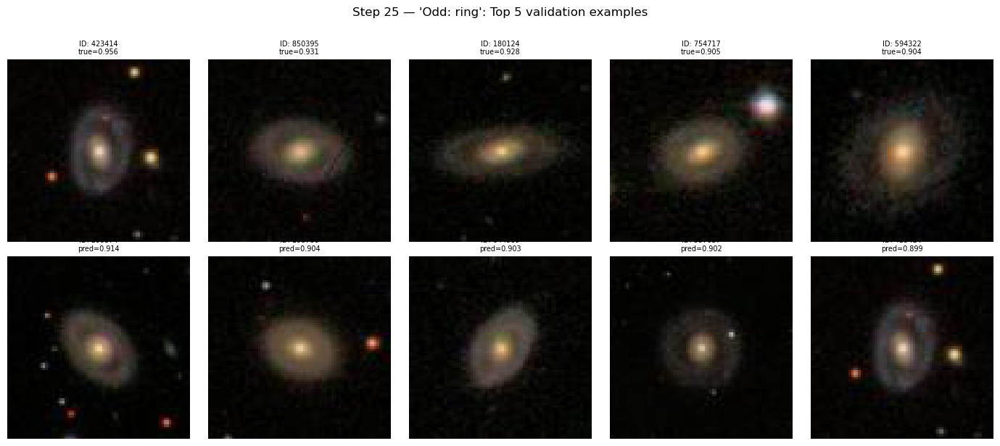

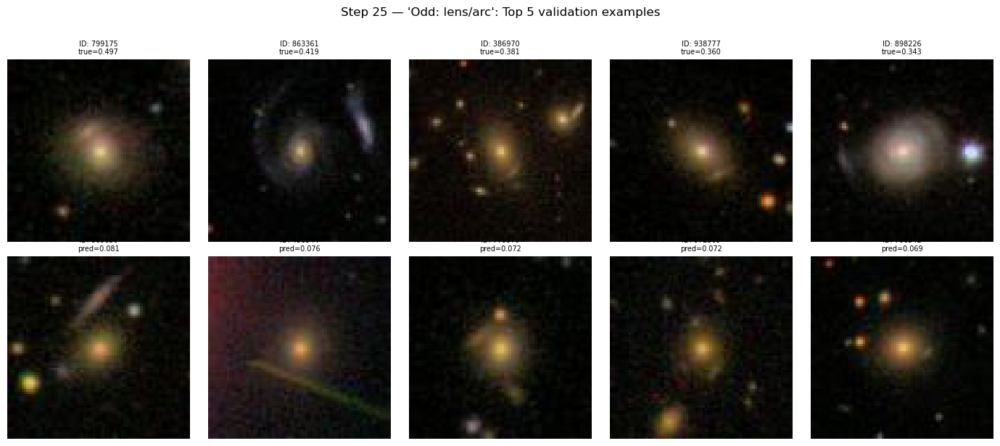

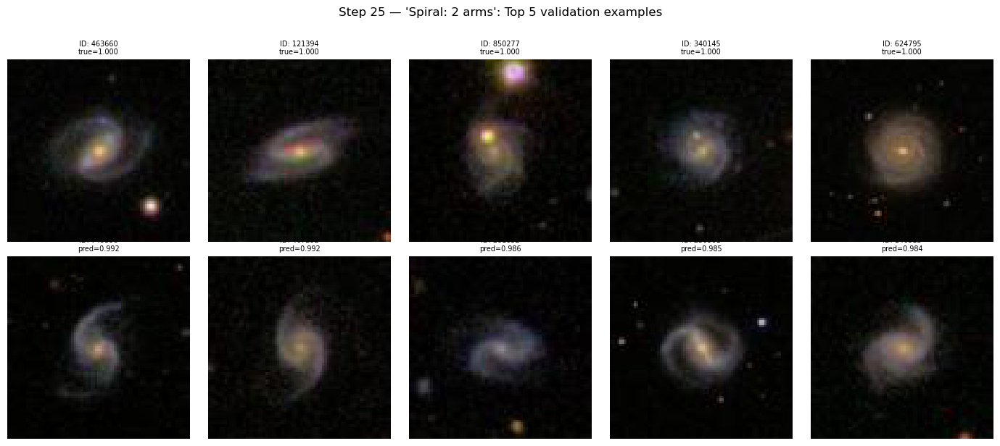

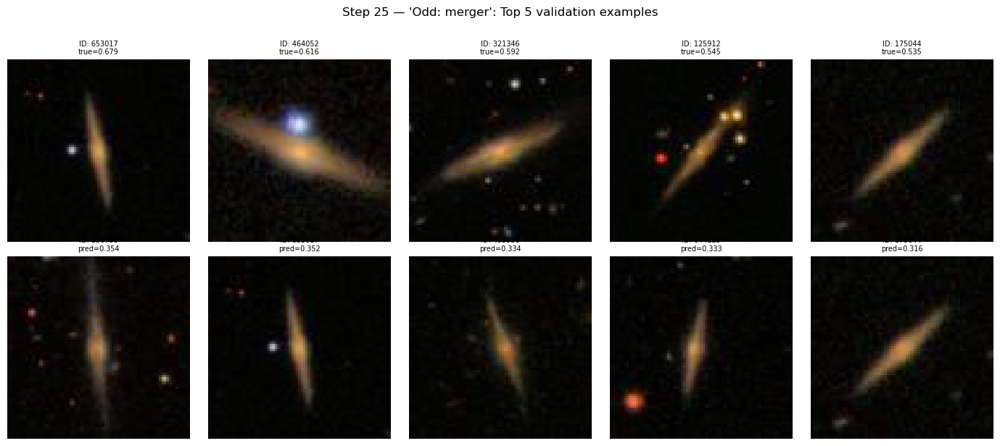

In [39]:
TARGET_LABELS = {
    "Class1.1": "Smooth",
    "Class1.3": "Star or artifact",
    "Class2.1": "Edge-on disk",
    "Class8.1": "Odd: ring",
    "Class8.2": "Odd: lens/arc",
    "Class4.1": "Spiral: 2 arms",   # filter to 2-arm spirals below
    "Class9.2": "Odd: merger",
}

# all_preds and all_labels collected in step 24 — shape (N_val, 37)
# val_df index was reset during dataset creation so we need the galaxy IDs
val_ids = val_df.iloc[:, 0].astype(int).values   # first column = galaxy ID


def load_image(galaxy_id, image_dir=DOWNSIZED_DIR):
    """Load a downsized image as a (H, W, 3) float array in [0, 1]."""
    path = os.path.join(image_dir, f"{galaxy_id}.jpg")
    return np.array(Image.open(path).convert("RGB")) / 255.0


def plot_top5(axes_row, galaxy_ids, scores, title_prefix, label_name):
    """Plot 5 images with their score in the title."""
    top5_idx = np.argsort(scores)[-5:][::-1]   # indices of 5 highest scores
    for col, idx in enumerate(top5_idx):
        ax  = axes_row[col]
        gid = galaxy_ids[idx]
        img = load_image(gid)
        ax.imshow(img)
        ax.set_title(f"ID: {gid}\n{title_prefix}={scores[idx]:.3f}", fontsize=7)
        ax.axis("off")
    axes_row[0].set_ylabel(label_name, fontsize=8, rotation=90,
                           labelpad=4, va="center")


#Plot: one figure per label, two rows each (true / predicted) 

for class_key, label_name in TARGET_LABELS.items():

    if class_key not in label_columns:
        print(f"Warning: {class_key} not found in label_columns — skipping.")
        continue

    col_idx    = list(label_columns).index(class_key)
    true_vals  = all_labels[:, col_idx]
    pred_vals  = all_preds[:,  col_idx]

    fig, axes = plt.subplots(2, 5, figsize=(14, 6))
    fig.suptitle(f"Step 25 — '{label_name}': Top 5 validation examples",
                 fontsize=12, y=1.02)

    # Row 0: top 5 by TRUE label
    plot_top5(axes[0], val_ids, true_vals,
              title_prefix="true", label_name="(a) True labels")

    # Row 1: top 5 by PREDICTED label
    plot_top5(axes[1], val_ids, pred_vals,
              title_prefix="pred", label_name="(b) Predicted labels")

    plt.tight_layout()
    safe_name = label_name.replace("/", "_").replace(" ", "_")
    plt.savefig(f"step25_{safe_name}.png", dpi=150, bbox_inches="tight")
    plt.show()

In [40]:
# ── Per-label commentary helper ───────────────────────────────────────────────
# Prints overlap between true top-5 and predicted top-5 for each label.
# A high overlap means the model reliably finds the right galaxies.

print(f"{'Label':<22} {'True∩Pred overlap':>20}  Comment")
print("─" * 70)

for class_key, label_name in TARGET_LABELS.items():
    if class_key not in label_columns:
        continue
    col_idx   = list(label_columns).index(class_key)
    true_top5 = set(val_ids[np.argsort(all_labels[:, col_idx])[-5:]])
    pred_top5 = set(val_ids[np.argsort(all_preds[:,  col_idx])[-5:]])
    overlap   = len(true_top5 & pred_top5)
    print(f"{label_name:<22} {overlap}/5 galaxies match")

Label                     True∩Pred overlap  Comment
──────────────────────────────────────────────────────────────────────
Smooth                 0/5 galaxies match
Star or artifact       1/5 galaxies match
Edge-on disk           1/5 galaxies match
Odd: ring              1/5 galaxies match
Odd: lens/arc          0/5 galaxies match
Spiral: 2 arms         0/5 galaxies match
Odd: merger            2/5 galaxies match


Found 79975 test images
Downsizing complete.
Test set: 79975 images, 625 batches
Predictions collected for 79975 test galaxies
Saved predictions to test_predictions.csv

Test set size            : 79,975
Merger threshold         : 0.5
N galaxies flagged merger: 1,011
Raw merger fraction      : 0.0126  (1.26%)


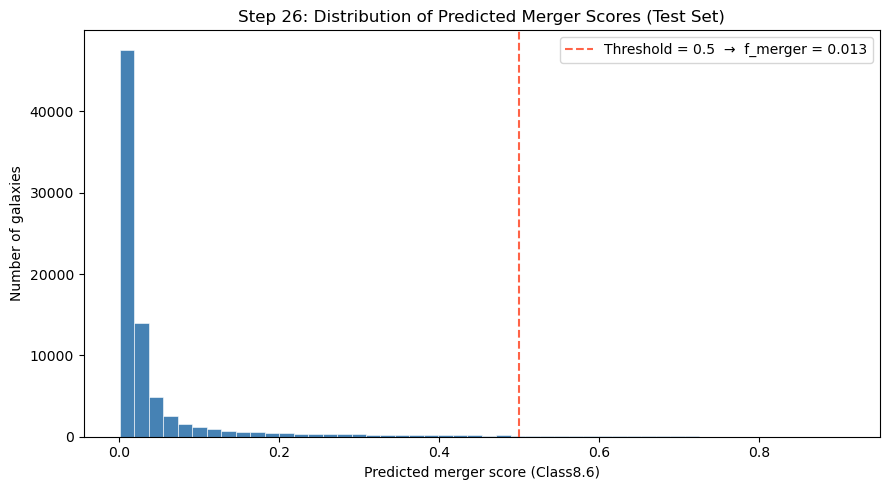


── Comparison to Lotz et al. Fig 13 (z~0) ──────────────────────────────
Your raw merger fraction          : 1.26%
Lotz et al. observed range (z~0)  : 1% – 4%
Lotz et al. theoretical (z~0)     : 2%

Assuming T_merger = 0.5 Gyr:
Implied merger rate               : 0.025 Gyr^-1
Lotz et al. observed rate (z~0)   : ~0.02–0.08 Gyr^-1


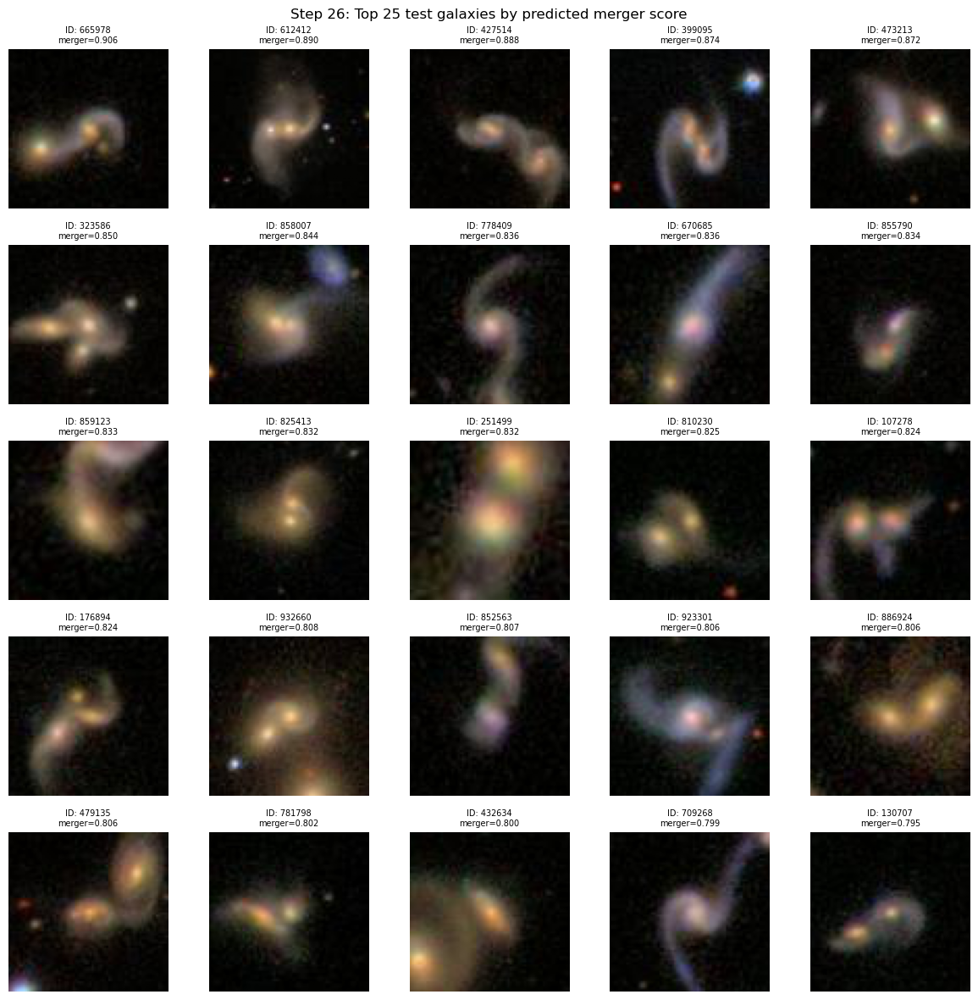

In [41]:
#Run model on test images and estimate the merger fraction 

import glob

TEST_IMAGE_DIR = "test_images"          # untar test_images.tar.gz here
TEST_DOWNSIZED_DIR  = "downsized_test_images"
os.makedirs(TEST_DOWNSIZED_DIR, exist_ok=True)

MERGER_COL = "Class8.6"   # the merger label


# Downsize all test images (same pipeline as training set) 

test_image_paths = sorted(glob.glob(os.path.join(TEST_IMAGE_DIR, "*.jpg")))
print(f"Found {len(test_image_paths)} test images")

for img_path in test_image_paths:
    img_name    = os.path.basename(img_path)
    output_path = os.path.join(TEST_DOWNSIZED_DIR, img_name)
    if os.path.exists(output_path):
        continue   # skip if already downsized
    _, downsized = downsize_image(img_path)
    Image.fromarray(downsized).save(output_path)

print("Downsizing complete.")


# Build a Dataset and DataLoader for the test set 

class GalaxyTestDataset(Dataset):
    """
    Like GalaxyDataset but for unlabelled test images.
    Returns (image_tensor, galaxy_id) instead of (image_tensor, labels).
    """
    def __init__(self, image_dir):
        self.image_dir = image_dir
        self.img_files = sorted(os.listdir(image_dir))

    def __len__(self):
        return len(self.img_files)

    def __getitem__(self, idx):
        fname = self.img_files[idx]
        galaxy_id = int(os.path.splitext(fname)[0])
        img = Image.open(os.path.join(self.image_dir, fname)).convert("RGB")
        tensor = torch.tensor(
            np.array(img), dtype=torch.float32
        ).permute(2, 0, 1) / 255.0
        return tensor, galaxy_id


test_dataset = GalaxyTestDataset(TEST_DOWNSIZED_DIR)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE,
                          shuffle=False, num_workers=0, pin_memory=False)

print(f"Test set: {len(test_dataset)} images, {len(test_loader)} batches")


# Run the best model on all test images 

best_model.eval()

test_preds = []
test_ids = []

with torch.no_grad():
    for images, ids in test_loader:
        images = images.to(device)
        preds = best_model(images).cpu().numpy()
        test_preds.append(preds)
        test_ids.extend(ids.numpy())

test_preds = np.concatenate(test_preds, axis=0)   # (N_test, 37)
test_ids   = np.array(test_ids)

print(f"Predictions collected for {len(test_preds)} test galaxies")

# Save predictions to CSV so you don't have to rerun inference
merger_col_idx = list(label_columns).index(MERGER_COL)
test_pred_df   = pd.DataFrame(test_preds, columns=label_columns)
test_pred_df.insert(0, "galaxy_id", test_ids)
test_pred_df.to_csv("test_predictions.csv", index=False)
print("Saved predictions to test_predictions.csv")

merger_scores = test_preds[:, merger_col_idx]
THRESHOLD     = 0.5

n_mergers       = np.sum(merger_scores >= THRESHOLD)
merger_fraction = n_mergers / len(merger_scores)

print(f"\nTest set size            : {len(merger_scores):,}")
print(f"Merger threshold         : {THRESHOLD}")
print(f"N galaxies flagged merger: {n_mergers:,}")
print(f"Raw merger fraction      : {merger_fraction:.4f}  ({merger_fraction*100:.2f}%)")


# Distribution of predicted merger scores 

fig, ax = plt.subplots(figsize=(9, 5))
ax.hist(merger_scores, bins=50, color="steelblue", edgecolor="white", linewidth=0.4)
ax.axvline(THRESHOLD, color="tomato", linestyle="--", linewidth=1.5,
           label=f"Threshold = {THRESHOLD}  →  f_merger = {merger_fraction:.3f}")
ax.set_xlabel("Predicted merger score (Class8.6)")
ax.set_ylabel("Number of galaxies")
ax.set_title("Step 26: Distribution of Predicted Merger Scores (Test Set)")
ax.legend()
plt.tight_layout()
plt.savefig("step26_merger_scores.png", dpi=150)
plt.show()

#comparing to theoretical predictions from Lotz et al. 2013
lotz_observed_low  = 0.01   # ~1%  lower bound from observations
lotz_observed_high = 0.04   # ~4%  upper bound from observations
lotz_theory        = 0.02   # ~2%  theoretical prediction (Hopkins et al.)

print("\n── Comparison to Lotz et al. Fig 13 (z~0) ──────────────────────────────")
print(f"Your raw merger fraction          : {merger_fraction*100:.2f}%")
print(f"Lotz et al. observed range (z~0)  : {lotz_observed_low*100:.0f}% – "
      f"{lotz_observed_high*100:.0f}%")
print(f"Lotz et al. theoretical (z~0)     : {lotz_theory*100:.0f}%")

# Lotz et al. quote merger RATES (Gyr^-1), not fractions directly.
# To convert our fraction to a rate we need a merger timescale T_merger.
# A typical observability timescale for morphological disturbances is ~0.5 Gyr.
T_merger = 0.5   # Gyr  — morphological disturbance timescale

merger_rate = merger_fraction / T_merger
print(f"\nAssuming T_merger = {T_merger} Gyr:")
print(f"Implied merger rate               : {merger_rate:.3f} Gyr^-1")
print(f"Lotz et al. observed rate (z~0)   : ~0.02–0.08 Gyr^-1")


#  Plot a sample of galaxies the model flagged as mergers 

top_merger_idx = np.argsort(merger_scores)[-25:][::-1]

fig, axes = plt.subplots(5, 5, figsize=(12, 12))
axes = axes.flatten()

for i, idx in enumerate(top_merger_idx):
    gid = test_ids[idx]
    img = load_image(gid, image_dir=TEST_DOWNSIZED_DIR)
    axes[i].imshow(img)
    axes[i].set_title(f"ID: {gid}\nmerger={merger_scores[idx]:.3f}", fontsize=7)
    axes[i].axis("off")

fig.suptitle("Step 26: Top 25 test galaxies by predicted merger score", fontsize=12)
plt.tight_layout()
plt.savefig("step26_top_mergers.png", dpi=150)
plt.show()